In [54]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import pandas as pd
from sklearn.model_selection import train_test_split
import shutil
import time
import copy
from models.lr_finder import LRFinder
from fastai.vision import transform as tfm
from gradcam.misc_functions import save_class_activation_images
from gradcam.misc_functions import apply_colormap_on_image
from gradcam.gradcam import GradCam
from PIL import Image

from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

import pickle

### Creating image datasets an data loaders for train and test using the experiments folder split

In [2]:
experiments_path = '/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0'
data_path = '/home/nischal/code/fontastic/data/dst/training/'

In [3]:
train_rand_tfms = tfm.get_transforms(do_flip=False)
test_rand_tfms = tfm.get_transforms(do_flip=False)

In [4]:
        #transforms.ColorJitter(brightness=(1, 1.2), contrast=0.1, saturation=0.1, hue=0.1),


In [5]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(224),
        transforms.RandomAffine(degrees=5, fillcolor=(255, 255, 255)),
        transforms.ToTensor(), 
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]), 
    'test' : transforms.Compose([
        transforms.Resize(224),
        transforms.RandomAffine(degrees=5, fillcolor=(255, 255, 255)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
}

In [6]:
def get_train_files_path(experiments_path, data_path, phase):
    if phase == 'train':
        file_name = 'train.csv'
    elif phase == 'test':
        file_name = 'test.csv'
    else:
        print("phase can only have train and test as parameter values")
        exit()
    file_path = os.path.join(experiments_path, file_name)
    train_df = pd.read_csv(file_path, delimiter=',')
    files_path = []
    fonts_class = []
    for row in train_df.iterrows():
        files_path.append(os.path.join(data_path, row[1]['class'], row[1]['filename']))
        fonts_class.append(row[1]['class'])
    
    return files_path, fonts_class

In [7]:
def copy_images_to_path(file_path, file_class, destination_dir):
    font_folder = os.path.join(destination_dir, file_class)
    if os.path.exists(font_folder) == False:
        os.makedirs(font_folder)
    
    print("File being copied from {}:{}".format(file_path, font_folder))
    shutil.copy(file_path, font_folder)
    #shutil.copyfile(file_path, font_folder)
    

In [8]:
X_train, y_train = get_train_files_path(experiments_path, data_path, phase='train')
X_test, y_test = get_train_files_path(experiments_path, data_path, phase='test')

In [9]:
train_dir = os.path.join(experiments_path, 'train')
test_dir = os.path.join(experiments_path, 'test')

if not os.path.exists(train_dir):
    os.makedirs(train_dir)

if not os.path.exists(test_dir):
    os.makedirs(test_dir)

In [10]:
for file_path, font_class in zip(X_train, y_train):
    copy_images_to_path(file_path, font_class, train_dir)

File being copied from /home/nischal/code/fontastic/data/dst/training/Roboto_Slab/RobotoSlab-Bold_150_rand_crop_2.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Roboto_Slab
File being copied from /home/nischal/code/fontastic/data/dst/training/Source_Code_Pro/SourceCodePro-Black_150_rand_crop_7.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Source_Code_Pro
File being copied from /home/nischal/code/fontastic/data/dst/training/Biryani/Biryani-SemiBold_80_rand_crop_1.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Biryani
File being copied from /home/nischal/code/fontastic/data/dst/training/Pattaya/Pattaya-Regular_150_rand_crop_8.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Pattaya
File being copied from /home/nischal/code/fontastic/data/dst/training/Asap/Asap-MediumItalic_150_rand_crop_1.jpg:/home/nischal/code/fontastic/experi

File being copied from /home/nischal/code/fontastic/data/dst/training/Oswald/Oswald-ExtraLight_80_rand_crop_5.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Oswald
File being copied from /home/nischal/code/fontastic/data/dst/training/Share/Share-Italic_80_rand_crop_5.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Share
File being copied from /home/nischal/code/fontastic/data/dst/training/Rubik/Rubik-LightItalic_300_rand_crop_0.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Rubik
File being copied from /home/nischal/code/fontastic/data/dst/training/Alegreya_Sans/AlegreyaSans-Thin_300_rand_crop_8.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Alegreya_Sans
File being copied from /home/nischal/code/fontastic/data/dst/training/Alegreya_Sans/AlegreyaSans-Medium_150_rand_crop_2.jpg:/home/nischal/code/fontastic/experiments/fd727d3f

File being copied from /home/nischal/code/fontastic/data/dst/training/Alegreya_Sans/AlegreyaSans-Bold_300_rand_crop_7.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Alegreya_Sans
File being copied from /home/nischal/code/fontastic/data/dst/training/Raleway/Raleway-ExtraLight_50_rand_crop_6.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Raleway
File being copied from /home/nischal/code/fontastic/data/dst/training/PT_Serif/PT_Serif-Web-Regular_300_rand_crop_6.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/PT_Serif
File being copied from /home/nischal/code/fontastic/data/dst/training/Lato/Lato-Black_50_rand_crop_2.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Lato
File being copied from /home/nischal/code/fontastic/data/dst/training/Cambay/Cambay-BoldItalic_80_rand_crop_1.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-7

File being copied from /home/nischal/code/fontastic/data/dst/training/Fira_Sans_Condensed/FiraSansCondensed-Light_50_rand_crop_8.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Fira_Sans_Condensed
File being copied from /home/nischal/code/fontastic/data/dst/training/Montserrat/Montserrat-Italic_300_rand_crop_4.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Montserrat
File being copied from /home/nischal/code/fontastic/data/dst/training/Source_Code_Pro/SourceCodePro-Bold_80_rand_crop_1.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Source_Code_Pro
File being copied from /home/nischal/code/fontastic/data/dst/training/Crimson_Text/CrimsonText-BoldItalic_50_rand_crop_7.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Crimson_Text
File being copied from /home/nischal/code/fontastic/data/dst/training/Alegreya_Sans/AlegreyaSans-ThinIt

File being copied from /home/nischal/code/fontastic/data/dst/training/Rasa/Rasa-Light_300_rand_crop_0.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Rasa
File being copied from /home/nischal/code/fontastic/data/dst/training/Merriweather/Merriweather-Black_300_rand_crop_9.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Merriweather
File being copied from /home/nischal/code/fontastic/data/dst/training/EB_Garamond/EBGaramond-Bold_80_rand_crop_3.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/EB_Garamond
File being copied from /home/nischal/code/fontastic/data/dst/training/Raleway/Raleway-Medium_300_rand_crop_9.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Raleway
File being copied from /home/nischal/code/fontastic/data/dst/training/PT_Serif/PT_Serif-Web-BoldItalic_150_rand_crop_0.jpg:/home/nischal/code/fontastic/experiments/fd72

File being copied from /home/nischal/code/fontastic/data/dst/training/Crimson_Text/CrimsonText-BoldItalic_150_rand_crop_4.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Crimson_Text
File being copied from /home/nischal/code/fontastic/data/dst/training/Lato/Lato-Bold_300_rand_crop_5.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Lato
File being copied from /home/nischal/code/fontastic/data/dst/training/Open_Sans/OpenSans-SemiBold_300_rand_crop_1.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Open_Sans
File being copied from /home/nischal/code/fontastic/data/dst/training/Roboto/Roboto-Thin_80_rand_crop_5.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Roboto
File being copied from /home/nischal/code/fontastic/data/dst/training/Montserrat/Montserrat-Black_150_rand_crop_9.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4

File being copied from /home/nischal/code/fontastic/data/dst/training/Lato/Lato-Regular_80_rand_crop_2.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Lato
File being copied from /home/nischal/code/fontastic/data/dst/training/Roboto_Mono/RobotoMono-Thin_80_rand_crop_5.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Roboto_Mono
File being copied from /home/nischal/code/fontastic/data/dst/training/Lato/Lato-Hairline_80_rand_crop_5.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Lato
File being copied from /home/nischal/code/fontastic/data/dst/training/PT_Serif/PT_Serif-Web-BoldItalic_50_rand_crop_0.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/PT_Serif
File being copied from /home/nischal/code/fontastic/data/dst/training/Lora/Lora-BoldItalic_300_rand_crop_5.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e1

File being copied from /home/nischal/code/fontastic/data/dst/training/Raleway/Raleway-Light_50_rand_crop_6.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Raleway
File being copied from /home/nischal/code/fontastic/data/dst/training/Playfair_Display/PlayfairDisplay-Bold_300_rand_crop_2.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Playfair_Display
File being copied from /home/nischal/code/fontastic/data/dst/training/Scada/Scada-Italic_150_rand_crop_2.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Scada
File being copied from /home/nischal/code/fontastic/data/dst/training/Playfair_Display/PlayfairDisplay-Black_50_rand_crop_3.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Playfair_Display
File being copied from /home/nischal/code/fontastic/data/dst/training/Fira_Sans_Condensed/FiraSansCondensed-Thin_80_rand_crop_4.jpg:/home/ni

File being copied from /home/nischal/code/fontastic/data/dst/training/Merriweather/Merriweather-Bold_300_rand_crop_2.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Merriweather
File being copied from /home/nischal/code/fontastic/data/dst/training/Share/Share-Regular_300_rand_crop_1.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Share
File being copied from /home/nischal/code/fontastic/data/dst/training/Prociono/Prociono-Regular_50_rand_crop_4.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Prociono
File being copied from /home/nischal/code/fontastic/data/dst/training/Merriweather/Merriweather-Italic_300_rand_crop_6.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Merriweather
File being copied from /home/nischal/code/fontastic/data/dst/training/Crimson_Text/CrimsonText-SemiBold_150_rand_crop_8.jpg:/home/nischal/code/fontastic/e

In [11]:
for file_path, font_class in zip(X_test, y_test):
    copy_images_to_path(file_path, font_class, test_dir)

File being copied from /home/nischal/code/fontastic/data/dst/training/Roboto/Roboto-Light_150_rand_crop_2.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/test/Roboto
File being copied from /home/nischal/code/fontastic/data/dst/training/Inconsolata/Inconsolata-Bold_300_rand_crop_9.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/test/Inconsolata
File being copied from /home/nischal/code/fontastic/data/dst/training/Montserrat/Montserrat-ThinItalic_80_rand_crop_3.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/test/Montserrat
File being copied from /home/nischal/code/fontastic/data/dst/training/Merriweather/Merriweather-Bold_50_rand_crop_4.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/test/Merriweather
File being copied from /home/nischal/code/fontastic/data/dst/training/Lato/Lato-HairlineItalic_50_rand_crop_5.jpg:/home/nischal/code/fontastic/experiments

File being copied from /home/nischal/code/fontastic/data/dst/training/Playfair_Display/PlayfairDisplay-BoldItalic_150_rand_crop_6.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/test/Playfair_Display
File being copied from /home/nischal/code/fontastic/data/dst/training/Nova_Flat/NovaFlat_300_rand_crop_0.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/test/Nova_Flat
File being copied from /home/nischal/code/fontastic/data/dst/training/Lato/Lato-Black_50_rand_crop_7.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/test/Lato
File being copied from /home/nischal/code/fontastic/data/dst/training/Rasa/Rasa-Bold_300_rand_crop_1.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/test/Rasa
File being copied from /home/nischal/code/fontastic/data/dst/training/Fira_Sans_Condensed/FiraSansCondensed-SemiBoldItalic_300_rand_crop_2.jpg:/home/nischal/code/fontastic/experi

File being copied from /home/nischal/code/fontastic/data/dst/training/Asap/Asap-Italic_150_rand_crop_1.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/test/Asap
File being copied from /home/nischal/code/fontastic/data/dst/training/Philosopher/Philosopher-Bold_80_rand_crop_0.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/test/Philosopher
File being copied from /home/nischal/code/fontastic/data/dst/training/EB_Garamond/EBGaramond-BoldItalic_50_rand_crop_9.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/test/EB_Garamond
File being copied from /home/nischal/code/fontastic/data/dst/training/Roboto_Condensed/RobotoCondensed-LightItalic_50_rand_crop_5.jpg:/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/test/Roboto_Condensed
File being copied from /home/nischal/code/fontastic/data/dst/training/Open_Sans/OpenSans-SemiBold_50_rand_crop_3.jpg:/home/nischal/code/font

In [12]:
image_datasets = {x: datasets.ImageFolder(os.path.join(experiments_path, x), data_transforms[x]) for x in ['train', 'test']}

In [13]:
image_datasets

{'train': Dataset ImageFolder
     Number of datapoints: 9570
     Root Location: /home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train
     Transforms (if any): Compose(
                              Resize(size=224, interpolation=PIL.Image.BILINEAR)
                              RandomAffine(degrees=(-5, 5), fillcolor=(255, 255, 255))
                              ToTensor()
                              Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
                          )
     Target Transforms (if any): None, 'test': Dataset ImageFolder
     Number of datapoints: 3190
     Root Location: /home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/test
     Transforms (if any): Compose(
                              Resize(size=224, interpolation=PIL.Image.BILINEAR)
                              RandomAffine(degrees=(-5, 5), fillcolor=(255, 255, 255))
                              ToTensor()
                     

In [14]:
class_names = image_datasets['train'].classes

In [15]:
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], 
                                             batch_size=32, 
                                             shuffle=True, 
                                             num_workers=4) 
               for x in ['train', 'test']}

In [16]:
device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")

In [17]:
device

device(type='cuda', index=1)

In [18]:
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'test']}


### Visualizing images

In [19]:
def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(20,20))
    plt.imshow(inp)

    if title is not None:
        plt.title(title)
    plt.pause(0.001)
    

In [20]:
inputs, classes = next(iter(dataloaders['train']))
out = torchvision.utils.make_grid(inputs)

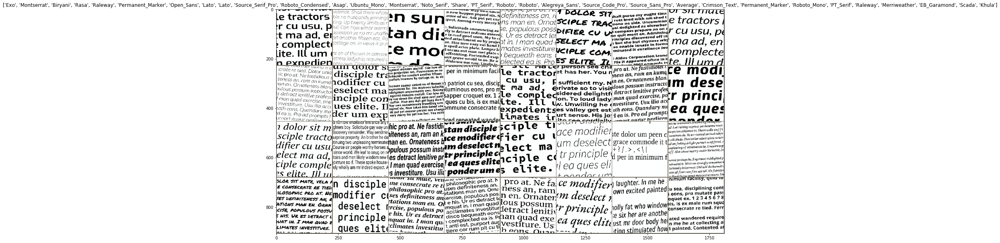

In [21]:
imshow(out, title=[class_names[x] for x in classes])

In [22]:
def build_images(n=10):
    image_dict = []
    iterator = iter(dataloaders['train'])
    for i in range(n):
        image_def = {}
        inputs, classes = iterator.next()
        out = torchvision.utils.make_grid(inputs)
        image_def['out'] = out
        image_def['classes'] = classes
        #print(image_def)
        image_dict.append(image_def)
    
    return image_dict

In [23]:
image_dict = build_images()

In [24]:
def show_images(image_slider):
    imshow(image_dict[image_slider]['out'], title=[class_names[x] for x in image_dict[image_slider]['classes']])
    

In [25]:
interact(show_images, image_slider=widgets.IntSlider(min=0, max=len(image_dict)-1, step=1, value=0))

interactive(children=(IntSlider(value=0, description='image_slider', max=9), Output()), _dom_classes=('widget-…

<function __main__.show_images(image_slider)>

## Gradcam utilities

In [26]:
def preprocess_image(pil_im, resize_im=True):
    """
        Processes image for CNNs

    Args:
        PIL_img (PIL_img): Image to process
        resize_im (bool): Resize to 224 or not
    returns:
        im_as_var (torch variable): Variable that contains processed float tensor
    """
    # mean and std list for channels (Imagenet)
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]
    # Resize image
    if resize_im:
        pil_im.thumbnail((224, 224))
    im_as_arr = np.float32(pil_im)
    im_as_arr = im_as_arr.transpose(2, 0, 1)  # Convert array to D,W,H
    # Normalize the channels
    for channel, _ in enumerate(im_as_arr):
        im_as_arr[channel] /= 224
        im_as_arr[channel] -= mean[channel]
        im_as_arr[channel] /= std[channel]
    # Convert to float tensor
    im_as_ten = torch.from_numpy(im_as_arr).float()
    # Add one more channel to the beginning. Tensor shape = 1,3,224,224
    im_as_ten.unsqueeze_(0)
    # Convert to Pytorch variable
    im_as_var = torch.autograd.Variable(im_as_ten, requires_grad=True)
    return im_as_var

In [27]:
example_list = (('/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Lora/Lora-Regular_300_rand_crop_7.jpg', 2),
                ('/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Lato/Lato-Regular_300_rand_crop_6.jpg', 1),
                ('/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Fahkwang/Fahkwang-BoldItalic_150_rand_crop_3.jpg', 1),
                ('/home/nischal/code/fontastic/experiments/fd727d3f-73f4-4ec6-8e89-3e15fd3801b0/train/Merriweather/Merriweather-Black_50_rand_crop_7.jpg', 1)
                )

def select_image(select_image_index):
    img_path = example_list[select_image_index][0]
    target_class = example_list[select_image_index][1]
    if os.path.exists(img_path):
        file_name_to_export = img_path[img_path.rfind('/')+1:img_path.rfind('.')]
        original_image = Image.open(img_path).convert('RGB')
        prep_img = preprocess_image(original_image)
    else:
        original_image = None
        prep_img = None
        target_class = None

    return original_image, prep_img, target_class

In [28]:
orig_image, prep_image, target_class = select_image(0)

In [29]:
def generate_grad_cam(model, preprocess_image, target_class, layer=4):
    model = model.to(torch.device("cpu"))
    grad_cam = GradCam(model, target_layer=layer)

    cam = grad_cam.generate_cam(preprocess_image, target_class)
    return cam

In [30]:
def show_grad_cam(epoch, image_number, layer):
    grad_cam_epoch = show_grad_cam[epoch][image_number][layer]
    plt.imshow(grad_cam_epoch)
   

In [ ]:
cam = generate_grad_cam(model_ft, prep_image, target_class, layer=1)
cam, cam_im_on_image = apply_colormap_on_image(orig_image, cam, colormap_name='hsv' )
plt.imshow(cam_im_on_image)

### Training the model

In [55]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=20):
    since = time.time()
    best_acc = 0.0
    best_model = copy.deepcopy(model.state_dict())
    epoch_information = []
    
    '''
    The epoch information will contain gradcam 
    for all the layers for selected images
    There will be 2 sliders, one for epoch, given epoch, grad cam at each layer
    '''
    
    new_freeze_state = None
    prev_freeze_state = False
    for epoch in range(num_epochs):
        print("Epoch {}/{}".format(epoch, num_epochs - 1))
        print('-' * 10)
        for phase in ['train', 'test']:
            if phase == 'train':
                scheduler.step()
                model.train()
            else:
                model.eval()
                
            running_loss = 0.0
            running_corrects = 0
        
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)
                #print(inputs.shape)
                
                optimizer.zero_grad()
                
                
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)
                    
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
                        
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            
            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            
            '''
            Grad cam generation for selected images
            '''
            
            grad_cam_epoch_image = []
            for i in range(len(example_list)):
                print("Reading example index {}".format(i))
                orig_image, preprocess_image, target_class = select_image(i)
                if orig_image != None:
                    grad_cam_epoch_layer = []
                    for layer_number in range(1, 10):
                        try:
                            print("Processing layer number {}".format(layer_number))
                            cam = generate_grad_cam(model, preprocess_image, target_class, layer=layer_number)
                            cam, cam_im_on_image = apply_colormap_on_image(orig_image, cam, colormap_name='hsv' )
                            grad_cam_epoch_layer.append(cam_im_on_image)
                        except Exception as e:
                            break
                    
                    print("Adding all layers grad cam to list {}".format(len(grad_cam_epoch_layer)))
                    model = model.to(torch.device(device))
                    grad_cam_epoch_image.append(grad_cam_epoch_layer)
            if phase == 'train':
                epoch_information.append(grad_cam_epoch_image)
            
            
            print('{} Loss: {:.4f} Acc:{:.4f}'.format(
                phase, epoch_loss, epoch_acc))
            
            
            if phase == 'test' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model = copy.deepcopy(model.state_dict())
            
            print()
            
    
    time_elapsed = time.time() - since
    print('Training complete in {:0f}m {:.0f}s'.format(
    time_elapsed // 60, time_elapsed % 60))
    print('Best val acc: {:4f}'.format(best_acc))
    
    model.load_state_dict(best_model)
    return model, epoch_information
                

In [56]:
import ssl


In [57]:
ssl._create_default_https_context = ssl._create_unverified_context

In [58]:
model_ft = models.resnet50(pretrained=True)

num_frts = model_ft.fc.in_features
model_ft.fc = nn.Linear(num_frts, len(class_names))

model_ft = model_ft.to(device)
criterion = nn.CrossEntropyLoss()

optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.01, momentum=0.9)
#optimizer_ft = optim.Adam(model_ft.parameters(), lr=1e-03, weight_decay=1e-02)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

In [59]:
model_ft_resnet50, epoch_information_resnet50 = train_model(model_ft, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=20)

Epoch 0/19
----------
Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_r

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
hooked
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_r

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

/home/nischal/code/fontastic/notebooks/gradcam/gradcam.py:94: RuntimeWarning: invalid value encountered in true_divide
  cam = (cam - np.min(cam)) / (np.max(cam) - np.min(cam))  # Normalize between 0-1


torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 64, 56, 56])
tensor([[ 5.0669,  4.9865, -2.2865,  3.1801, -2.3398,  1.8128,  6.4825, -1.8333,
         -2.9990, -0.4237,  1.2125, -1.0793,  2.8515, -1.9642, -4.6480, -1.5284,
         -2.0627, -1.3602, -3.8081, -0.3979,  0.6959, -1.9163, -0.7820, -2.8026,
         -1.6156, -1.6693,  0.5590,  3.7236, -0.3244,  8.4829, -1.7110, -1.5595,
          0.5899, -5.3568,  7.0007, -3.5911, -2.6501,  4.9174, -1.6846,  6.4049,
         -3.3955, -2.0199, -3.3546, -2.3765,  0.0231, -0.1864, -4.1100, -2.7416,
         -0.7951,  6.1126, -4.7551,  5.1137,  2.6985, -0.0804,  1.0696, -3.6654,
          6.1374,  1.6951, -0.8177, -0.4972, -6.0503, -0.8132, -1.3560,  8.7148,
         -2.4077, -0.1242, -3.6523,  5.0562]], grad_fn=<AddmmBackward>)
Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64,

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
hooked
torch.Size([1, 2048, 1, 1])
tensor([[ 5.0669,  4.9865, -2.2865,  3.1801, -2.3398,  1.8128,  6.4825, -1.8333,
         -2.9990, -0.4237,  1.2125, -1.0793,  2.8515, -1.9642, -4.6480, -1.5284,
         -2.0627, -1.3602, -3.8081, -0.3979,  0.6959, -1.9163, -0.7820, -2.8026,
         -1.6156, -1.6693,  0.5590,  3.7236, -0.3244,  8.4829, -1.7110, -1.5595,
          0.5899, -5.3568,  7.0007, -3.5911, -2.6501,  4.9174, -1.6846,  6.4049,
         -3.3955, -2.0199, -3.3546, -2.3765,  0.0231, -0.1864, -4.1100, -2.7416,
         -0.7951,  6.1126, -4.7551,  5.1137,  2.6985, -0.0804,  1.0696, -3.6654,
          6.1374,  1.6951, -0.8177, -0.4972, -6.0503, -0.8132, -1.3560,  8.7148,
         -2.4077, -0.1242, -3.6523,  5.0562]], grad_fn=<AddmmBackward>)
Processing layer number 9
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size(

Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[ 4.7912,  5.6226, -0.2302, -0.9265,  1.0935,  1.0693,  0.8396,  1.4503,
          0.6410, -0.9197,  7.2577,  4.4328,  5.3842,  5.6435, -5.6825, -2.2619,
          0.7783,  1.1026, -4.7272, -3.2886, -1.9271,  0.6681, -3.4549, -1.0889,
          3.7180, -3.5786,  0.4281, -1.3825, -1.1757,  5.4695,  1.7118,  2.7184,
          0.7793, -3.1940, -1.5836, -0.2539, -3.9668,  0.1576, -1.3216,  3.5534,
         -3.5955, -2.8818,  1.6517,  0.7538,  1.0621,  1.7291,  1.3954,  1.0960,
          2.3274,  3.3751, -0.7528, -1.3119, -4.0129, -1.2309,  1.5640, -4.2043,
         -0.8221, -1.2126,  1.0310,  1.9314, -6.2718, -3.0561, -3.5253,  3.8626,
          3.0525, -4.4024, -5.2786,  1.1540]], grad_fn=<AddmmBackward>)
Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 6

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 64, 56, 56])
tensor([[ 5.0669,  4.9865, -2.2865,  3.1801, -2.3398,  1.8128,  6.4825, -1.8333,
         -2.9990, -0.4237,  1.2125, -1.0793,  2.8515, -1.9642, -4.6480, -1.5284,
         -2.0627, -1.3602, -3.8081, -0.3979,  0.6959, -1.9163, -0.7820, -2.8026,
         -1.6156, -1.6693,  0.5590,  3.7236, -0.3244,  8.4829, -1.7110, -1.5595,
          0.5899, -5.3568,  7.0007, -3.5911, -2.6501,  4.9174, -1.6846,  6.4049,
         -3.3955, -2.0199, -3.3546, -2.3765,  0.0231, -0.1864, -4.1100, -2.7416,
         -0.7951,  6.1126, -4.7551,  5.1137,  2.6985, -0.0804,  1.0696, -3.6654,
          6.1374,  1.6951, -0.8177, -0.4972, -6.0503, -0.8132, -1.3560,  8.7148,
         -2.4077, -0.1242, -3.6523,  5.0562]], grad_fn=<AddmmBackward>)
Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64,

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
hooked
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_r

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

torch.Size([1, 256, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(256, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(128, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(256, 512, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(512, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=Tr

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 64, 56, 56])
tensor([[ 2.2218,  2.4420,  0.1722, -1.3925,  1.6696, -2.9862, -2.8009,  5.7398,
          0.0417, -4.4282,  3.3588,  2.7766,  1.8760,  2.2438, -6.6764,  3.3774,
          1.2876,  2.1642, -1.1634, -0.9563, -3.0638, -1.9379, -4.5068,  0.8749,
          4.7356, -1.0843, -1.6368, -5.3263, -1.9642,  1.5386, -1.5048,  9.1014,
         -4.2087,  4.7199, -3.5893,  3.4045, -3.0623, -5.9336, -1.6514, -0.4211,
         -3.6064, -1.7820,  2.9295, -0.2567, -1.7022,  5.9529,  1.5918,  8.3567,
          6.4310,  2.7216,  4.1149,  4.0577, -0.9870, -1.7928,  1.7270, -2.6727,
         -0.1347, -2.7520, -2.3442,  2.9596, -4.3452, -0.0186, -6.4352, -0.6040,
         11.5641, -5.8802, -6.5119, -2.8311]], grad_fn=<AddmmBackward>)
Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64,

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[ 2.2218,  2.4420,  0.1722, -1.3925,  1.6696, -2.9862, -2.8009,  5.7398,
          0.0417, -4.4282,  3.3588,  2.7766,  1.8760,  2.2438, -6.6764,  3.3774,
          1.2876,  2.1642, -1.1634, -0.9563, -3.0638, -1.9379, -4.5068,  0.8749,
          4.7356, -1.0843, -1.6368, -5.3263, -1.9642,  1.5386, -1.5048,  9.1014,
         -4.2087,  4.7199, -3.5893,  3.4045, -3.0623, -5.9336, -1.6514, -0.4211,
         -3.6064, -1.7820,  2.9295, -0.2567, -1.7022,  5.9529,  1.5918,  8.3567,
          6.4310,  2.7216,  4.1149,  4.0577, -0.9870, -1.7928,  1.7270, -2.6727,
         -0.1347, -2.7520, -2.3442,  2.9596, -4.3452, -0.0186, -6.4352, -0.6040,
         11.5641, -5.8802, -6.5119, -2.8311]], grad_fn=<AddmmBackward>)
Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 6

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 512, 28, 28])
tensor([[  4.9582,   4.4559,  -4.2529,  -0.0691,  -2.6020,   1.5389,   0.9817,
          -1.4888,  -2.2637,  -2.8968,   5.6199,   0.0537,   3.3409,  -1.5473,
          -5.5712,  -0.0947,  -2.7732,  -1.5891,  -3.2371,   1.2815,  -1.5078,
          -2.1052,  -0.5153,  -5.6548,  -1.2736,  -1.5802,  -2.3568,   2.1443,
          -0.3935,  12.3637,  -2.5214,   2.4051,  -1.4986,  -4.6852,   2.5936,
           0.9320,  -0.5917,   1.1727,   3.4510,   4.9003,  -5.1317,  -2.5581,
          -2.0797,  -0.7025,  -3.3187,   6.8727,  -0.8903,   2.2843,   0.9029,
           3.9057,  -3.6411,  12.9143,   5.4391,   1.4708,   1.7411,  -3.6020,
           6.8146,   2.7059,  -2.8724,   0.7489,  -6.7753,  -1.0777,  -4.3281,
           9.7326,   1.6938,  -6.4587, -10.0876,   0.1010]],
       grad_fn=<AddmmBackward>)
Processing layer number 6
torch.Size([1, 3, 224, 224])
Conv2d(3, 

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Reading example index 2
Reading example index 3
train Loss: 1.1504 Acc:0.6343

Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): Batch

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 64, 56, 56])
tensor([[ 2.2218,  2.4420,  0.1722, -1.3925,  1.6696, -2.9862, -2.8009,  5.7398,
          0.0417, -4.4282,  3.3588,  2.7766,  1.8760,  2.2438, -6.6764,  3.3774,
          1.2876,  2.1642, -1.1634, -0.9563, -3.0638, -1.9379, -4.5068,  0.8749,
          4.7356, -1.0843, -1.6368, -5.3263, -1.9642,  1.5386, -1.5048,  9.1014,
         -4.2087,  4.7199, -3.5893,  3.4045, -3.0623, -5.9336, -1.6514, -0.4211,
         -3.6064, -1.7820,  2.9295, -0.2567, -1.7022,  5.9529,  1.5918,  8.3567,
          6.4310,  2.7216,  4.1149,  4.0577, -0.9870, -1.7928,  1.7270, -2.6727,
         -0.1347, -2.7520, -2.3442,  2.9596, -4.3452, -0.0186, -6.4352, -0.6040,
         11.5641, -5.8802, -6.5119, -2.8311]], grad_fn=<AddmmBackward>)
Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64,

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[ 2.2218,  2.4420,  0.1722, -1.3925,  1.6696, -2.9862, -2.8009,  5.7398,
          0.0417, -4.4282,  3.3588,  2.7766,  1.8760,  2.2438, -6.6764,  3.3774,
          1.2876,  2.1642, -1.1634, -0.9563, -3.0638, -1.9379, -4.5068,  0.8749,
          4.7356, -1.0843, -1.6368, -5.3263, -1.9642,  1.5386, -1.5048,  9.1014,
         -4.2087,  4.7199, -3.5893,  3.4045, -3.0623, -5.9336, -1.6514, -0.4211,
         -3.6064, -1.7820,  2.9295, -0.2567, -1.7022,  5.9529,  1.5918,  8.3567,
          6.4310,  2.7216,  4.1149,  4.0577, -0.9870, -1.7928,  1.7270, -2.6727,
         -0.1347, -2.7520, -2.3442,  2.9596, -4.3452, -0.0186, -6.4352, -0.6040,
         11.5641, -5.8802, -6.5119, -2.8311]], grad_fn=<AddmmBackward>)
Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 6

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

tensor([[  4.9582,   4.4559,  -4.2529,  -0.0691,  -2.6020,   1.5389,   0.9817,
          -1.4888,  -2.2637,  -2.8968,   5.6199,   0.0537,   3.3409,  -1.5473,
          -5.5712,  -0.0947,  -2.7732,  -1.5891,  -3.2371,   1.2815,  -1.5078,
          -2.1052,  -0.5153,  -5.6548,  -1.2736,  -1.5802,  -2.3568,   2.1443,
          -0.3935,  12.3637,  -2.5214,   2.4051,  -1.4986,  -4.6852,   2.5936,
           0.9320,  -0.5917,   1.1727,   3.4510,   4.9003,  -5.1317,  -2.5581,
          -2.0797,  -0.7025,  -3.3187,   6.8727,  -0.8903,   2.2843,   0.9029,
           3.9057,  -3.6411,  12.9143,   5.4391,   1.4708,   1.7411,  -3.6020,
           6.8146,   2.7059,  -2.8724,   0.7489,  -6.7753,  -1.0777,  -4.3281,
           9.7326,   1.6938,  -6.4587, -10.0876,   0.1010]],
       grad_fn=<AddmmBackward>)
Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentu

Processing layer number 6
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
hooked
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 2048, 7, 7])
tensor([[  4.9582,   4.4559,  -4.2529,  -0.0691,  -2.6020,   1.5389,   0.9817,
          -1.4888,  -2.2637,  -2.8968,   5.6199,   0.0537,   3.3409,  -1.5473,
          -5.5712,  -0.0947,  -2.7732,  -1.5891,  -3.2371,   1.2815,  -1.5078,
          -2.1052,  -0.5153,  -5.6548,  -1.2736,  -1.5802,  -2.3568,   2.1443,
          -0.3935,  12.3637,  -2.5214,   2.4051,  -1.4986,  -4.6852,   2.5936,
           0.9320,  -0.5917,   1.1727,   3.4510,   4.9003,  -5.1317,  -2.5581,
          -2.0797,  -0.7025,  -3.3187,   6.8727,  -0.8903,   2.2843,   0.9029,
           3.9057,  -3.6411,  12.9143,   5.4391,   1.4708,   1.7411,  -3.6020,
           6.8146,   2.7059,  -2.8724,   0.7489,  -6.7753,  -1.0777,  -4.3281,
           9.7326,   1.6938,  -6.4587, -10.0876,   0.1010]],
       grad_fn=<AddmmBackward>)
Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv

Processing layer number 9
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
hooked
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_r

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
hooked
torch.Size([1, 2048, 1, 1])
tensor([[ 6.5471, 10.3651, -4.5191, -0.5828, -3.2493,  4.8827,  2.4875, -2.1926,
         -1.2938, -1.8539,  2.9309,  2.2850,  1.9221, -0.0130, -1.7037, -3.7552,
          0.3485, -1.5566, -4.7132,  0.6695,  1.1488, -0.7311,  2.4677, -5.1857,
         -2.2896, -3.4503, -1.2091,  2.8055,  0.6911, 11.6453, -0.0147, -0.0117,
          2.2023, -5.2467,  2.3446, -4.6444, -2.6365,  4.8209,  5.4765,  4.6560,
         -2.7610, -4.1219, -1.5247,  0.0545, -0.6173,  0.8895, -0.2508, -0.9558,
         -0.2726,  0.8402, -3.2390,  4.2453,  1.7988, -2.8986, -1.9843,  0.9249,
          2.3409,  3.3139,  2.2206,  0.6064, -5.5492, -1.7977, -2.3566,  7.1857,
         -4.3518, -5.7878, -8.0922,  2.2290]], grad_fn=<AddmmBackward>)
Processing layer number 9
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size(

Reading example index 2
Reading example index 3
train Loss: 0.7686 Acc:0.7463

Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): Batch

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
hooked
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_r

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequentia

Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Reading example index 1
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 6
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 9
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[ 2.6785,  3.3497, -3.2003, -2.8092,  0.3483, -1.5353, -1.6433,  0.6564,
          0.9252, -3.9310,  9.1180,  3.7479,  3.8806,  5.4303, -6.8962, -2.1385,
          1.1959, -1.4629, -4.0603, -1.5763, -4.8339,  0.5784, -4.7767, -3.4231,
          4.4066,  1.2688, -2.1199, -3.1581, -1.0189,  5.8549, -1.3696,  9.4018,
         -2.5845, -0.6772, -0.0251,  2.4252, -3.6063, -2.3719,  5.7968,  0.5928,
         -4.2108, -3.7194,  0.0622,  0.9742, -2.9158,  5.8099,  5.7153,  7.4907,
          5.9744,  3.3165,  1.5370,  6.0055,  0.4858,  0.3116,  1.4449, -3.5368,
          3.5069, -0.2999, -1.6892, -0.6784, -5.9799, -3.7650, -5.9332,  4.8424,
          4.4880, -7.2820, -9.8179, -2.5105]], grad_fn=<AddmmBackward>)
Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 6

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
Adding all layers grad cam to list 8
Reading example index 1
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, ker

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[ 5.1773,  5.6765, -5.5171, -0.4518, -2.9629,  3.3070,  2.7358, -3.1969,
         -3.0272, -1.7718,  6.6034, -0.4785,  4.9960, -0.6627, -3.9696, -3.2870,
         -2.1280, -2.7285, -5.6253,  0.6255, -1.0556, -0.8332,  0.7953, -6.3361,
         -2.4070,  0.6650, -1.5093,  3.0391, -0.9934, 15.8678, -3.1882,  1.6617,
         -0.3230, -6.2754,  7.9303, -2.9300, -2.4187,  6.2827,  4.5482,  6.5039,
         -4.3217, -3.9609, -4.7303, -0.8931, -2.0928,  2.5040, -2.4920,  0.1407,
          2.1858,  3.9501, -4.9354,  7.8281,  2.3802,  0.8348,  0.6294, -2.4389,
          4.7816,  5.1790, -0.6903, -0.0360, -8.0722, -2.1923, -1.6943, 10.8033,
         -4.9305, -5.1583, -9.6349,  4.7721]], grad_fn=<AddmmBackward>)
Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 6

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(

Reading example index 2
Reading example index 3
train Loss: 0.4711 Acc:0.8416

Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): Batch

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 64, 56, 56])
tensor([[ 1.4947,  0.7207,  2.6121, -1.3870,  1.0995, -6.4159, -1.5824, 10.6029,
         -2.1404, -5.3490,  2.6788, -0.1624, -0.0836, -2.2719, -5.6534,  3.2774,
          1.8012,  2.8286, -4.3211, -0.5098, -3.7808, -1.5896, -6.4590,  4.5802,
          8.1762, -0.0229, -1.7720, -7.5653, -3.1876, -0.6503, -0.8485, 12.8897,
         -5.3554,  9.4361, -5.3364,  4.4600, -4.9234, -7.1570, -0.9830,  0.3894,
         -2.3711, -1.3620,  0.9283,  0.8581, -2.2812,  6.6626,  1.1531,  8.9916,
          8.0341,  6.0749,  5.2598,  2.7543, -0.0721, -3.0344,  3.2937, -2.2747,
          1.1885, -4.8174, -3.8372,  0.7924, -3.8721, -0.8929, -8.6312, -0.9671,
         12.6986, -2.6483, -4.4144, -4.8925]], grad_fn=<AddmmBackward>)
Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64,

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
hooked
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_r

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 2048, 1, 1])
torch.Size([1, 64, 56, 56])
tensor([[ 6.5980,  5.8391, -3.7181,  3.0732, -3.6982, -0.2670,  7.5488,  0.2810,
         -4.8722, -0.9985,  3.3053, -5.0810,  2.7071, -5.2858,  0.1634, -0.5221,
         -2.2812,  0.1728, -6.2031,  1.8549,  2.9419, -2.4170,  0.7816, -3.7015,
         -1.9536, -0.8433,  0.1375,  2.4624, -2.0072, 11.9907, -2.7159,  0.1750,
         -1.2875, -3.3487,  6.3161, -5.6438, -3.7535,  5.0387, -0.1451, 13.1099,
         -3.4647, -1.9014, -5.8622, -1.7601, -0.3917,  1.8473, -5.2738, -0.2594,
          2.3678,  7.2475, -6.1564,  6.2101,  1.1132, -3.0943,  0.8479, -0.7255,
          3.3280,  3.1277, -2.5989,  1.1863, -7.4249,  2.0346, -3.0068,  4.9063,
         -4.7753, -0.5830, -5.5995,  5.0919]], grad_fn=<AddmmBackward>)
Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_ru

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
hooked
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_r

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
Adding all layers grad cam to list 8
Reading example index 2
Reading example index 3
test Loss: 0.6610 Acc:0.7821

Epoch 5/19
----------
Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(

torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(256, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (co

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 9
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 64, 112, 112])
tensor([[-2.0755,  1.2616, -2.4981, -0.0270, -4.0303, -1.5640,  4.4348,  0.3205,
         -5.3332,  0.6500,  4.2235, -4.9193, -1.4193, -5.8753,  5.1484, -1.9144,
         -0.7734,  1.0945, -8.1651,  2.5464,  6.4809, -2.0367,  6.3049, -5.3193,
         -4.2295, -3.5425, -0.5330,  5.9479, -2.3129, 12.1541, -2.9766, -1.7748,
          3.4564, -1.4389,  4.8802, -3.2770, -2.0347, 10.6527,  2.4539, 12.9709,
         -2.1148, -3.2052, -3.2883, -1.7993, -3.0034,  5.2174, -0.7686,  1.3760,
          1.1188,  0.6426, -6.7582,  5.4176,  2.1249, -0.7010,  0.4770,  2.8227,
          5.4170,  2.9244, -4.2868, -0.8557, -6.7636,  0.4126, -7.0144,  5.7800,
         -7.0087,  0.0742, -4.5699,  2.0840]], grad_fn=<AddmmBackward>)
Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 6

Processing layer number 3
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
hooked
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 256, 56, 56])
tensor([[-2.0755,  1.2616, -2.4981, -0.0270, -4.0303, -1.5640,  4.4348,  0.3205,
         -5.3332,  0.6500,  4.2235, -4.9193, -1.4193, -5.8753,  5.1484, -1.9144,
         -0.7734,  1.0945, -8.1651,  2.5464,  6.4809, -2.0367,  6.3049, -5.3193,
         -4.2295, -3.5425, -0.5330,  5.9479, -2.3129, 12.1541, -2.9766, -1.7748,
          3.4564, -1.4389,  4.8802, -3.2770, -2.0347, 10.6527,  2.4539, 12.9709,
         -2.1148, -3.2052, -3.2883, -1.7993, -3.0034,  5.2174, -0.7686,  1.3760,
          1.1188,  0.6426, -6.7582,  5.4176,  2.1249, -0.7010,  0.4770,  2.8227,
          5.4170,  2.9244, -4.2868, -0.8557, -6.7636,  0.4126, -7.0144,  5.7800,
         -7.0087,  0.0742, -4.5699,  2.0840]], grad_fn=<AddmmBackward>)
Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64

Processing layer number 6
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
hooked
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 2048, 7, 7])
tensor([[-2.0755,  1.2616, -2.4981, -0.0270, -4.0303, -1.5640,  4.4348,  0.3205,
         -5.3332,  0.6500,  4.2235, -4.9193, -1.4193, -5.8753,  5.1484, -1.9144,
         -0.7734,  1.0945, -8.1651,  2.5464,  6.4809, -2.0367,  6.3049, -5.3193,
         -4.2295, -3.5425, -0.5330,  5.9479, -2.3129, 12.1541, -2.9766, -1.7748,
          3.4564, -1.4389,  4.8802, -3.2770, -2.0347, 10.6527,  2.4539, 12.9709,
         -2.1148, -3.2052, -3.2883, -1.7993, -3.0034,  5.2174, -0.7686,  1.3760,
          1.1188,  0.6426, -6.7582,  5.4176,  2.1249, -0.7010,  0.4770,  2.8227,
          5.4170,  2.9244, -4.2868, -0.8557, -6.7636,  0.4126, -7.0144,  5.7800,
         -7.0087,  0.0742, -4.5699,  2.0840]], grad_fn=<AddmmBackward>)
Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size(

Processing layer number 9
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 9
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
Adding all layers grad cam to list 8
Reading example index 2
Reading example index 3
test Loss: 1.3570 Acc:0.6705

Epoch 6/19
----------
Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 256, 56, 56])
tensor([[ 6.9271,  2.1199, -3.7056, -4.2000, -0.6475, -3.5713, -2.3647,  4.9045,
         -1.3056, -6.8362,  1.8377,  3.3062,  4.1772,  2.3793, -8.6762, -1.4153,
          0.1649,  0.9927, -4.2196, -3.5180, -6.5856, -1.2557, -7.8764, -0.3699,
          7.2424,  3.7198, -3.7104, -6.5409, -0.0718,  4.4989, -0.2820, 14.5923,
         -7.0134,  1.9007,  0.1465,  1.7650, -2.9725, -6.7593,  1.6661, -2.1881,
         -2.8310, -0.5425, -1.8131,  1.2624, -0.2360,  4.5819,  0.8527,  6.1061,
          7.7612,  8.0567,  3.0451,  6.4278, -0.3108,  2.0057,  4.4112, -6.3485,
          5.6838, -5.2368,  1.0342,  3.0782, -8.0941, -1.8984, -4.6750,  1.7239,
         12.3895, -6.9349, -3.7357, -2.3979]], grad_fn=<AddmmBackward>)
Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64

Processing layer number 6
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
hooked
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 2048, 7, 7])
tensor([[ 6.9271,  2.1199, -3.7056, -4.2000, -0.6475, -3.5713, -2.3647,  4.9045,
         -1.3056, -6.8362,  1.8377,  3.3062,  4.1772,  2.3793, -8.6762, -1.4153,
          0.1649,  0.9927, -4.2196, -3.5180, -6.5856, -1.2557, -7.8764, -0.3699,
          7.2424,  3.7198, -3.7104, -6.5409, -0.0718,  4.4989, -0.2820, 14.5923,
         -7.0134,  1.9007,  0.1465,  1.7650, -2.9725, -6.7593,  1.6661, -2.1881,
         -2.8310, -0.5425, -1.8131,  1.2624, -0.2360,  4.5819,  0.8527,  6.1061,
          7.7612,  8.0567,  3.0451,  6.4278, -0.3108,  2.0057,  4.4112, -6.3485,
          5.6838, -5.2368,  1.0342,  3.0782, -8.0941, -1.8984, -4.6750,  1.7239,
         12.3895, -6.9349, -3.7357, -2.3979]], grad_fn=<AddmmBackward>)
Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size(

Processing layer number 9
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Reading example index 2
Reading example index 3
train Loss: 0.2968 Acc:0.8953

Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): Batch

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[ 6.9271,  2.1199, -3.7056, -4.2000, -0.6475, -3.5713, -2.3647,  4.9045,
         -1.3056, -6.8362,  1.8377,  3.3062,  4.1772,  2.3793, -8.6762, -1.4153,
          0.1649,  0.9927, -4.2196, -3.5180, -6.5856, -1.2557, -7.8764, -0.3699,
          7.2424,  3.7198, -3.7104, -6.5409, -0.0718,  4.4989, -0.2820, 14.5923,
         -7.0134,  1.9007,  0.1465,  1.7650, -2.9725, -6.7593,  1.6661, -2.1881,
         -2.8310, -0.5425, -1.8131,  1.2624, -0.2360,  4.5819,  0.8527,  6.1061,
          7.7612,  8.0567,  3.0451,  6.4278, -0.3108,  2.0057,  4.4112, -6.3485,
          5.6838, -5.2368,  1.0342,  3.0782, -8.0941, -1.8984, -4.6750,  1.7239,
         12.3895, -6.9349, -3.7357, -2.3979]], grad_fn=<AddmmBackward>)
Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 6

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Reading example index 1
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 512, 28, 28])
tensor([[ 5.4539e+00,  6.5523e+00, -5.6838e+00, -3.6140e-01, -4.7721e+00,
          2.1209e+00,  5.0832e+00, -2.0844e+00, -1.9942e+00, -9.2333e-01,
          3.2965e+00, -7.7798e-01,  4.4463e+00, -1.8243e+00, -3.8705e+00,
         -3.6259e+00, -3.6151e+00, -1.3958e+00, -4.2673e+00,  3.5435e+00,
         -1.0896e+00, -1.0400e+00, -2.2319e+00, -6.1905e+00, -2.6865e+00,
         -2.9263e-01, -2.8476e+00,  4.7448e+00,  4.3123e-01,  1.5839e+01,
         -1.9221e+00,  8.0554e-01, -9.7839e-01, -6.7609e+00,  1.1043e+01,
         -3.5421e+00, -3.3418e+00,  5.6301e+00,  2.1131e+00,  7.4901e+00,
         -3.6625e+00, -1.9447e+00, -5.4898e+00, -1.0296e+00,  1.7019e-03,
          2.9678e+00, -2.5721e+00, -1.0060e+00, -4.7897e-01,  5.7401e+00,
         -5.6367e+00,  4.8088e+00,  1.0634e+00, -5.1006e-01,  1.0909e+00,
         -2.2277e+00,  1.7500e+00,  3.8246e+00, -7.0548

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Reading example index 2
Reading example index 3
test Loss: 0.3193 Acc:0.8862

Epoch 7/19
----------
Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=Fa

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[ 7.6576,  2.1557, -3.5756, -4.5213, -0.2474, -3.4525, -2.3318,  5.3771,
         -1.3066, -7.1175,  2.2387,  2.6708,  3.6103,  2.7243, -8.9363, -2.3845,
          0.1089,  2.4809, -4.4506, -4.9150, -6.2048, -1.9965, -7.2419, -0.8477,
          7.5870,  4.8798, -3.9072, -6.5949, -0.4821,  4.4989, -0.6683, 15.7799,
         -7.1961,  2.1213, -1.0367,  1.7723, -2.4357, -6.3325,  2.0355, -2.5210,
         -2.8031, -0.7591, -2.2491,  0.8518, -0.6776,  5.1235, -0.1789,  5.9808,
          9.9088,  6.8596,  4.3415,  6.3759, -0.0714,  2.4221,  4.2176, -6.6398,
          7.7179, -4.7349,  0.3059,  3.0050, -8.1307, -2.1281, -5.2103,  0.8058,
         11.8668, -7.1178, -3.8192, -2.2220]], grad_fn=<AddmmBackward>)
Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 6

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Reading example index 2
Reading example index 3
train Loss: 0.1100 Acc:0.9623

Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): Batch

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[ 7.6576,  2.1557, -3.5756, -4.5213, -0.2474, -3.4525, -2.3318,  5.3771,
         -1.3066, -7.1175,  2.2387,  2.6708,  3.6103,  2.7243, -8.9363, -2.3845,
          0.1089,  2.4809, -4.4506, -4.9150, -6.2048, -1.9965, -7.2419, -0.8477,
          7.5870,  4.8798, -3.9072, -6.5949, -0.4821,  4.4989, -0.6683, 15.7799,
         -7.1961,  2.1213, -1.0367,  1.7723, -2.4357, -6.3325,  2.0355, -2.5210,
         -2.8031, -0.7591, -2.2491,  0.8518, -0.6776,  5.1235, -0.1789,  5.9808,
          9.9088,  6.8596,  4.3415,  6.3759, -0.0714,  2.4221,  4.2176, -6.6398,
          7.7179, -4.7349,  0.3059,  3.0050, -8.1307, -2.1281, -5.2103,  0.8058,
         11.8668, -7.1178, -3.8192, -2.2220]], grad_fn=<AddmmBackward>)
Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 6

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Reading example index 2
Reading example index 3
test Loss: 0.0892 Acc:0.9708

Epoch 8/19
----------
Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=Fa

torch.Size([1, 256, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(256, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(128, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(256, 512, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(512, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=Tr

Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
hooked
torch.Size([1, 2048, 1, 1])
tensor([[  8.2480,   2.2429,  -3.7219,  -5.8006,   0.3279,  -3.8276,  -2.8154,
           6.5548,  -1.2300,  -8.1412,   2.4621,   3.6596,   4.6348,   4.2233,
         -10.2367,  -2.8554,   1.1393,   2.9280,  -4.8242,  -6.1374,  -6.8435,
          -2.2047,  -8.2080,  -0.2902,   9.5530,   5.7583,  -4.0347,  -8.0595,
          -0.5555,   4.6904,  -0.6951,  18.4624,  -8.3749,   2.8857,  -2.1302,
           1.3673,  -2.9564,  -7.4153,   1.7728,  -3.2285,  -2.6202,  -0.5012,
          -2.1981,   0.9896,  -0.0500,   4.8964,   0.0342,   6.9025,  11.1385,
           7.3146,   4.9999,   5.3795,  -1.0345,   2.5634,   4.2000,  -7.4200,
           6.7546,  -5.6908,   0.8175,   3.9003,  -8.9137,  -2.2785,  -5.4521,
           0.0454,  13.8509,  -8.1435,  -3.6484,  -2.2846]],
       grad_fn=<AddmmBackward>)
Processing layer number 9
torch.Size([1, 3, 224, 224])
Conv

Reading example index 1
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 6
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 9
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[  8.2480,   2.2429,  -3.7219,  -5.8006,   0.3279,  -3.8276,  -2.8154,
           6.5548,  -1.2300,  -8.1412,   2.4621,   3.6596,   4.6348,   4.2233,
         -10.2367,  -2.8554,   1.1393,   2.9280,  -4.8242,  -6.1374,  -6.8435,
          -2.2047,  -8.2080,  -0.2902,   9.5530,   5.7583,  -4.0347,  -8.0595,
          -0.5555,   4.6904,  -0.6951,  18.4624,  -8.3749,   2.8857,  -2.1302,
           1.3673,  -2.9564,  -7.4153,   1.7728,  -3.2285,  -2.6202,  -0.5012,
          -2.1981,   0.9896,  -0.0500,   4.8964,   0.0342,   6.9025,  11.1385,
           7.3146,   4.9999,   5.3795,  -1.0345,   2.5634,   4.2000,  -7.4200,
           6.7546,  -5.6908,   0.8175,   3.9003,  -8.9137,  -2.2785,  -5.4521,
           0.0454,  13.8509,  -8.1435,  -3.6484,  -2.2846]],
       grad_fn=<AddmmBackward>)
Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3,

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 64, 56, 56])
tensor([[  7.7167,   8.1251,  -7.1006,  -1.2696,  -5.4036,   3.4612,   5.2900,
          -2.2054,  -2.7756,  -1.6585,   4.8160,  -1.4213,   5.4300,  -1.2082,
          -5.1701,  -5.1617,  -3.2328,  -1.2482,  -6.1851,   3.1329,  -0.0509,
          -1.7282,  -1.0935,  -7.3081,  -3.2452,   0.3099,  -2.6187,   5.4336,
           0.2970,  19.4977,  -2.3838,   1.6621,  -1.0859,  -7.4279,  10.0513,
          -5.4511,  -4.5071,   8.6617,   2.3282,   9.6841,  -4.1351,  -2.9814,
          -6.1261,  -1.5335,   0.1276,   3.8625,  -3.2017,  -0.8543,   0.7387,
           6.4422,  -7.0516,   4.7100,  -0.5641,  -0.7602,  -0.5130,  -2.8523,
           2.4738,   5.1736,  -0.5798,   1.5190, -12.1283,  -1.9704,   1.3222,
          14.1568,  -6.3606,  -5.9103,  -5.9233,   7.9644]],
       grad_fn=<AddmmBackward>)
Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 6

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[  7.7167,   8.1251,  -7.1006,  -1.2696,  -5.4036,   3.4612,   5.2900,
          -2.2054,  -2.7756,  -1.6585,   4.8160,  -1.4213,   5.4300,  -1.2082,
          -5.1701,  -5.1617,  -3.2328,  -1.2482,  -6.1851,   3.1329,  -0.0509,
          -1.7282,  -1.0935,  -7.3081,  -3.2452,   0.3099,  -2.6187,   5.4336,
           0.2970,  19.4977,  -2.3838,   1.6621,  -1.0859,  -7.4279,  10.0513,
          -5.4511,  -4.5071,   8.6617,   2.3282,   9.6841,  -4.1351,  -2.9814,
          -6.1261,  -1.5335,   0.1276,   3.8625,  -3.2017,  -0.8543,   0.7387,
           6.4422,  -7.0516,   4.7100,  -0.5641,  -0.7602,  -0.5130,  -2.8523,
           2.4738,   5.1736,  -0.5798,   1.5190, -12.1283,  -1.9704,   1.3222,
          14.1568,  -6.3606,  -5.9103,  -5.9233,   7.9644]],
       grad_fn=<AddmmBackward>)
Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3,

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[  7.5214,   1.9683,  -3.8314,  -6.0701,   0.3239,  -3.9792,  -2.5179,
           6.3574,  -1.1185,  -7.5730,   3.2130,   3.5873,   4.5067,   5.1072,
         -10.3693,  -3.1810,   0.8234,   3.2093,  -4.9968,  -6.7613,  -7.1797,
          -2.2950,  -8.0950,  -0.9928,   9.2646,   5.2774,  -4.2548,  -7.6161,
          -0.3528,   5.0407,  -0.9906,  17.6891,  -8.3060,   1.8385,  -0.9349,
           2.2449,  -3.0646,  -6.4884,   3.4771,  -3.0465,  -2.9964,  -0.7554,
          -2.3359,   0.8969,  -0.2552,   5.1364,   0.8800,   7.2173,  10.3233,
           7.1160,   5.2277,   6.7242,  -0.5876,   3.6637,   5.1522,  -7.6137,
           7.5444,  -5.5455,  -0.0973,   2.6500,  -9.4565,  -3.1297,  -5.5335,
           1.1521,  12.4971,  -8.2154,  -4.2875,  -2.1577]],
       grad_fn=<AddmmBackward>)
Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
Adding all layers grad cam to list 8
Reading example index 1
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, ker

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Reading example index 2
Reading example index 3
train Loss: 0.0695 Acc:0.9742

Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): Batch

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 64, 56, 56])
tensor([[  7.5214,   1.9683,  -3.8314,  -6.0701,   0.3239,  -3.9792,  -2.5179,
           6.3574,  -1.1185,  -7.5730,   3.2130,   3.5873,   4.5067,   5.1072,
         -10.3693,  -3.1810,   0.8234,   3.2093,  -4.9968,  -6.7613,  -7.1797,
          -2.2950,  -8.0950,  -0.9928,   9.2646,   5.2774,  -4.2548,  -7.6161,
          -0.3528,   5.0407,  -0.9906,  17.6891,  -8.3060,   1.8385,  -0.9349,
           2.2449,  -3.0646,  -6.4884,   3.4771,  -3.0465,  -2.9964,  -0.7554,
          -2.3359,   0.8969,  -0.2552,   5.1364,   0.8800,   7.2173,  10.3233,
           7.1160,   5.2277,   6.7242,  -0.5876,   3.6637,   5.1522,  -7.6137,
           7.5444,  -5.5455,  -0.0973,   2.6500,  -9.4565,  -3.1297,  -5.5335,
           1.1521,  12.4971,  -8.2154,  -4.2875,  -2.1577]],
       grad_fn=<AddmmBackward>)
Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 6

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
hooked
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_r

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[  7.9441,   8.1948,  -7.5691,  -1.0681,  -5.6110,   3.4438,   4.8563,
          -2.2989,  -2.7294,  -1.6909,   5.0921,  -1.2350,   5.4041,  -0.9225,
          -6.0811,  -5.4328,  -3.5521,  -0.9732,  -5.9274,   2.9781,  -0.5025,
          -1.8730,  -1.5125,  -7.5460,  -3.3680,   0.6206,  -2.9608,   4.9406,
           0.2717,  20.1533,  -2.5864,   1.8343,  -1.4626,  -7.7202,  10.5116,
          -5.2817,  -4.5820,   8.7608,   3.9025,   9.1656,  -4.3362,  -3.0815,
          -6.4092,  -1.5467,   0.0305,   4.2386,  -3.5624,  -0.9388,   0.7574,
           6.3212,  -7.0338,   6.0290,   0.2101,  -0.3795,  -0.1751,  -3.1442,
           2.7419,   6.0210,  -1.0790,   1.2079, -12.6596,  -2.3454,   1.4739,
          14.9636,  -6.4514,  -6.2071,  -5.9274,   7.8808]],
       grad_fn=<AddmmBackward>)
Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3,

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 64, 56, 56])
tensor([[  6.8125,   1.3043,  -3.9455,  -6.8737,  -0.4553,  -4.2508,  -2.8468,
           5.4572,  -0.1858,  -7.8331,   3.4660,   4.1045,   3.1712,   5.7835,
         -10.3018,  -3.5418,   0.1569,   2.7483,  -4.7194,  -6.0900,  -8.1186,
          -1.6594,  -8.7578,  -2.3536,   7.9292,   4.8356,  -5.2669,  -7.1106,
           0.1947,   5.1513,  -0.3265,  18.7811,  -8.1408,   0.6396,  -0.0612,
           4.1891,  -2.6703,  -6.4925,   5.4793,  -3.5284,  -3.3496,  -1.1943,
          -2.0802,   1.6217,  -0.7588,   5.8286,   2.1601,   7.1472,   9.7491,
           6.5802,   6.1061,   8.8095,   0.6197,   5.3001,   5.8935,  -8.0110,
           9.0440,  -5.2441,  -0.4468,   1.5295,  -9.4847,  -4.6528,  -5.3595,
           1.6041,  12.0696,  -9.1776,  -5.1595,  -2.6232]],
       grad_fn=<AddmmBackward>)
Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 6

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
hooked
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_r

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 64, 56, 56])
tensor([[  8.3366,   7.5018,  -8.2069,  -2.6523,  -5.7652,   5.0578,   5.0481,
          -2.9308,  -1.8141,  -0.9559,   6.1227,   0.1187,   6.3350,   0.4667,
          -6.6487,  -6.2050,  -3.9675,  -1.1130,  -6.6899,   1.6087,  -1.0126,
          -1.2822,  -2.0008,  -8.4129,  -4.0387,   0.6205,  -3.3457,   6.2313,
           0.7509,  21.4833,  -2.3033,   1.8719,  -0.5612,  -9.2571,  11.2833,
          -5.0399,  -4.6259,   9.7391,   5.0528,   9.0795,  -4.7447,  -3.5832,
          -6.8206,  -1.3582,   0.2449,   4.0405,  -3.1912,  -1.3112,   0.6432,
           5.4773,  -7.3776,   7.3716,   0.0745,   0.9565,  -0.3240,  -3.7508,
           2.4217,   5.9070,  -0.2433,   0.9414, -13.8135,  -3.5356,   2.0794,
          16.0183,  -7.7157,  -7.6725,  -7.0029,   9.0869]],
       grad_fn=<AddmmBackward>)
Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 6

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[  8.3366,   7.5018,  -8.2069,  -2.6523,  -5.7652,   5.0578,   5.0481,
          -2.9308,  -1.8141,  -0.9559,   6.1227,   0.1187,   6.3350,   0.4667,
          -6.6487,  -6.2050,  -3.9675,  -1.1130,  -6.6899,   1.6087,  -1.0126,
          -1.2822,  -2.0008,  -8.4129,  -4.0387,   0.6205,  -3.3457,   6.2313,
           0.7509,  21.4833,  -2.3033,   1.8719,  -0.5612,  -9.2571,  11.2833,
          -5.0399,  -4.6259,   9.7391,   5.0528,   9.0795,  -4.7447,  -3.5832,
          -6.8206,  -1.3582,   0.2449,   4.0405,  -3.1912,  -1.3112,   0.6432,
           5.4773,  -7.3776,   7.3716,   0.0745,   0.9565,  -0.3240,  -3.7508,
           2.4217,   5.9070,  -0.2433,   0.9414, -13.8135,  -3.5356,   2.0794,
          16.0183,  -7.7157,  -7.6725,  -7.0029,   9.0869]],
       grad_fn=<AddmmBackward>)
Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3,

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 64, 56, 56])
tensor([[  6.8125,   1.3043,  -3.9455,  -6.8737,  -0.4553,  -4.2508,  -2.8468,
           5.4572,  -0.1858,  -7.8331,   3.4660,   4.1045,   3.1712,   5.7835,
         -10.3018,  -3.5418,   0.1569,   2.7483,  -4.7194,  -6.0900,  -8.1186,
          -1.6594,  -8.7578,  -2.3536,   7.9292,   4.8356,  -5.2669,  -7.1106,
           0.1947,   5.1513,  -0.3265,  18.7811,  -8.1408,   0.6396,  -0.0612,
           4.1891,  -2.6703,  -6.4925,   5.4793,  -3.5284,  -3.3496,  -1.1943,
          -2.0802,   1.6217,  -0.7588,   5.8286,   2.1601,   7.1472,   9.7491,
           6.5802,   6.1061,   8.8095,   0.6197,   5.3001,   5.8935,  -8.0110,
           9.0440,  -5.2441,  -0.4468,   1.5295,  -9.4847,  -4.6528,  -5.3595,
           1.6041,  12.0696,  -9.1776,  -5.1595,  -2.6232]],
       grad_fn=<AddmmBackward>)
Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 6

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[  6.8125,   1.3043,  -3.9455,  -6.8737,  -0.4553,  -4.2508,  -2.8468,
           5.4572,  -0.1858,  -7.8331,   3.4660,   4.1045,   3.1712,   5.7835,
         -10.3018,  -3.5418,   0.1569,   2.7483,  -4.7194,  -6.0900,  -8.1186,
          -1.6594,  -8.7578,  -2.3536,   7.9292,   4.8356,  -5.2669,  -7.1106,
           0.1947,   5.1513,  -0.3265,  18.7811,  -8.1408,   0.6396,  -0.0612,
           4.1891,  -2.6703,  -6.4925,   5.4793,  -3.5284,  -3.3496,  -1.1943,
          -2.0802,   1.6217,  -0.7588,   5.8286,   2.1601,   7.1472,   9.7491,
           6.5802,   6.1061,   8.8095,   0.6197,   5.3001,   5.8935,  -8.0110,
           9.0440,  -5.2441,  -0.4468,   1.5295,  -9.4847,  -4.6528,  -5.3595,
           1.6041,  12.0696,  -9.1776,  -5.1595,  -2.6232]],
       grad_fn=<AddmmBackward>)
Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3,

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
hooked
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_r

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
Adding all layers grad cam to list 8
Reading example index 2
Reading example index 3
test Loss: 0.0851 Acc:0.9696

Epoch 11/19
----------
Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[  7.2157,   1.0964,  -5.0449,  -6.1363,  -0.4323,  -4.3291,  -3.2207,
           6.2232,  -1.2928,  -7.9888,   4.7538,   2.5462,   4.5051,   5.3456,
         -11.6947,  -2.9673,   1.4152,   2.1497,  -4.9248,  -3.0863,  -7.4230,
          -2.6378,  -8.9786,  -1.2295,   9.3395,   5.4543,  -3.4081,  -7.7746,
           0.0363,   4.9119,  -1.1492,  19.1944,  -8.3573,   1.5699,  -0.4931,
           2.0912,  -3.9449,  -6.7887,   3.5416,  -2.2369,  -3.3982,  -1.4808,
          -1.3002,   1.0004,  -0.1484,   6.2498,   3.3547,   9.0395,   9.7621,
           6.7989,   3.6186,   7.9036,  -1.0821,   3.1543,   3.7466,  -8.4653,
           6.2503,  -5.0516,  -0.0659,   3.0588,  -8.7786,  -3.5320,  -4.4370,
           1.6690,  13.0877,  -9.0479,  -4.7053,  -2.4066]],
       grad_fn=<AddmmBackward>)
Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3,

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Reading example index 2
Reading example index 3
train Loss: 0.0574 Acc:0.9800

Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): Batch

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 64, 56, 56])
tensor([[  7.2157,   1.0964,  -5.0449,  -6.1363,  -0.4323,  -4.3291,  -3.2207,
           6.2232,  -1.2928,  -7.9888,   4.7538,   2.5462,   4.5051,   5.3456,
         -11.6947,  -2.9673,   1.4152,   2.1497,  -4.9248,  -3.0863,  -7.4230,
          -2.6378,  -8.9786,  -1.2295,   9.3395,   5.4543,  -3.4081,  -7.7746,
           0.0363,   4.9119,  -1.1492,  19.1944,  -8.3573,   1.5699,  -0.4931,
           2.0912,  -3.9449,  -6.7887,   3.5416,  -2.2369,  -3.3982,  -1.4808,
          -1.3002,   1.0004,  -0.1484,   6.2498,   3.3547,   9.0395,   9.7621,
           6.7989,   3.6186,   7.9036,  -1.0821,   3.1543,   3.7466,  -8.4653,
           6.2503,  -5.0516,  -0.0659,   3.0588,  -8.7786,  -3.5320,  -4.4370,
           1.6690,  13.0877,  -9.0479,  -4.7053,  -2.4066]],
       grad_fn=<AddmmBackward>)
Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 6

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[  7.2157,   1.0964,  -5.0449,  -6.1363,  -0.4323,  -4.3291,  -3.2207,
           6.2232,  -1.2928,  -7.9888,   4.7538,   2.5462,   4.5051,   5.3456,
         -11.6947,  -2.9673,   1.4152,   2.1497,  -4.9248,  -3.0863,  -7.4230,
          -2.6378,  -8.9786,  -1.2295,   9.3395,   5.4543,  -3.4081,  -7.7746,
           0.0363,   4.9119,  -1.1492,  19.1944,  -8.3573,   1.5699,  -0.4931,
           2.0912,  -3.9449,  -6.7887,   3.5416,  -2.2369,  -3.3982,  -1.4808,
          -1.3002,   1.0004,  -0.1484,   6.2498,   3.3547,   9.0395,   9.7621,
           6.7989,   3.6186,   7.9036,  -1.0821,   3.1543,   3.7466,  -8.4653,
           6.2503,  -5.0516,  -0.0659,   3.0588,  -8.7786,  -3.5320,  -4.4370,
           1.6690,  13.0877,  -9.0479,  -4.7053,  -2.4066]],
       grad_fn=<AddmmBackward>)
Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3,

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
Adding all layers grad cam to list 8
Reading example index 1
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, ker

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
hooked
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_r

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
hooked
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_r

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 64, 56, 56])
tensor([[  7.3594,   6.5285,  -8.2676,  -1.6891,  -5.7348,   2.3014,   5.2004,
          -1.1253,  -3.5396,  -1.1524,   9.3237,  -1.8191,   6.5379,  -1.4001,
          -6.6982,  -5.2992,  -3.7353,  -1.0199,  -8.0861,   5.6613,  -0.3714,
          -2.4389,  -2.3220,  -8.1753,  -3.4801,   0.5477,  -2.1211,   4.0944,
          -0.7750,  23.3708,  -3.2497,   3.1233,  -1.3506,  -7.2261,  11.0656,
          -5.3958,  -6.1076,   8.7432,   3.2618,  13.3502,  -5.7163,  -4.1931,
          -5.9213,  -1.5320,  -0.6860,   6.3703,  -2.9158,   0.7770,   2.0612,
           7.3864,  -8.4623,   8.5313,  -1.0765,  -1.1679,  -0.2290,  -4.2707,
           3.0573,   5.9965,  -2.4249,   1.4232, -13.7705,  -2.9102,  -0.6754,
          15.5975,  -6.6386,  -6.6443,  -7.1277,   7.8127]],
       grad_fn=<AddmmBackward>)
Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 6

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[  7.3594,   6.5285,  -8.2676,  -1.6891,  -5.7348,   2.3014,   5.2004,
          -1.1253,  -3.5396,  -1.1524,   9.3237,  -1.8191,   6.5379,  -1.4001,
          -6.6982,  -5.2992,  -3.7353,  -1.0199,  -8.0861,   5.6613,  -0.3714,
          -2.4389,  -2.3220,  -8.1753,  -3.4801,   0.5477,  -2.1211,   4.0944,
          -0.7750,  23.3708,  -3.2497,   3.1233,  -1.3506,  -7.2261,  11.0656,
          -5.3958,  -6.1076,   8.7432,   3.2618,  13.3502,  -5.7163,  -4.1931,
          -5.9213,  -1.5320,  -0.6860,   6.3703,  -2.9158,   0.7770,   2.0612,
           7.3864,  -8.4623,   8.5313,  -1.0765,  -1.1679,  -0.2290,  -4.2707,
           3.0573,   5.9965,  -2.4249,   1.4232, -13.7705,  -2.9102,  -0.6754,
          15.5975,  -6.6386,  -6.6443,  -7.1277,   7.8127]],
       grad_fn=<AddmmBackward>)
Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3,

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Reading example index 1
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(256, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (co

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 64, 56, 56])
tensor([[  7.3594,   6.5285,  -8.2676,  -1.6891,  -5.7348,   2.3014,   5.2004,
          -1.1253,  -3.5396,  -1.1524,   9.3237,  -1.8191,   6.5379,  -1.4001,
          -6.6982,  -5.2992,  -3.7353,  -1.0199,  -8.0861,   5.6613,  -0.3714,
          -2.4389,  -2.3220,  -8.1753,  -3.4801,   0.5477,  -2.1211,   4.0944,
          -0.7750,  23.3708,  -3.2497,   3.1233,  -1.3506,  -7.2261,  11.0656,
          -5.3958,  -6.1076,   8.7432,   3.2618,  13.3502,  -5.7163,  -4.1931,
          -5.9213,  -1.5320,  -0.6860,   6.3703,  -2.9158,   0.7770,   2.0612,
           7.3864,  -8.4623,   8.5313,  -1.0765,  -1.1679,  -0.2290,  -4.2707,
           3.0573,   5.9965,  -2.4249,   1.4232, -13.7705,  -2.9102,  -0.6754,
          15.5975,  -6.6386,  -6.6443,  -7.1277,   7.8127]],
       grad_fn=<AddmmBackward>)
Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 6

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Reading example index 2
Reading example index 3
test Loss: 0.0708 Acc:0.9730

Epoch 13/19
----------
Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=F

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
hooked
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_r

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
Adding all layers grad cam to list 8
Reading example index 1
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, ker

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 64, 56, 56])
tensor([[ 7.3979e+00,  6.7341e+00, -8.4482e+00, -2.4142e+00, -6.0252e+00,
          3.0493e+00,  4.5679e+00, -1.6775e+00, -3.4377e+00, -1.1250e+00,
          8.8992e+00, -1.7887e+00,  6.1910e+00, -1.4214e+00, -6.9748e+00,
         -5.8475e+00, -4.0910e+00, -9.0866e-01, -7.5783e+00,  5.2907e+00,
         -6.1084e-01, -2.3500e+00, -1.9360e+00, -8.6875e+00, -3.9562e+00,
          8.0389e-01, -2.5179e+00,  5.1194e+00, -4.1013e-01,  2.3828e+01,
         -3.2343e+00,  2.7658e+00, -8.2554e-01, -7.9454e+00,  1.1266e+01,
         -5.1154e+00, -3.9988e+00,  9.0893e+00,  4.0877e+00,  1.2226e+01,
         -5.2590e+00, -4.1921e+00, -6.1405e+00, -1.5726e+00, -5.3005e-01,
          6.4842e+00, -3.0631e+00, -1.7016e-02,  1.8420e+00,  6.0804e+00,
         -8.3800e+00,  7.7723e+00, -5.9071e-01,  5.6210e-01, -5.3428e-01,
         -4.1324e+00,  2.6128e+00,  7.3527e+00, -2.1503e

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
hooked
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_r

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[  5.9202,   0.9594,  -4.9272,  -6.3850,  -0.4996,  -5.0356,  -3.3555,
           6.7190,  -1.3062,  -8.2972,   6.3902,   2.1652,   3.6876,   4.2665,
         -11.8454,  -2.7171,   0.6239,   2.8308,  -4.8955,  -2.3279,  -7.3476,
          -3.0398,  -9.0698,  -2.1468,   8.8129,   4.9845,  -3.8361,  -7.9467,
          -1.0009,   6.4038,  -1.6000,  19.7658,  -8.1792,   2.4771,  -0.8071,
           3.9943,  -2.6574,  -7.0215,   4.3827,  -1.9025,  -3.6122,  -2.3244,
          -0.7360,   1.1100,  -1.2538,   8.1248,   3.0469,   9.6958,  10.8273,
           5.5585,   4.7053,   8.0702,   0.3144,   4.2884,   4.1527,  -8.4207,
           6.0326,  -4.0435,  -1.7153,   1.9070,  -9.6092,  -4.3620,  -5.0836,
           2.7166,  13.5955,  -9.1502,  -5.3326,  -3.1230]],
       grad_fn=<AddmmBackward>)
Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3,

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 64, 56, 56])
tensor([[ 7.3979e+00,  6.7341e+00, -8.4482e+00, -2.4142e+00, -6.0252e+00,
          3.0493e+00,  4.5679e+00, -1.6775e+00, -3.4377e+00, -1.1250e+00,
          8.8992e+00, -1.7887e+00,  6.1910e+00, -1.4214e+00, -6.9748e+00,
         -5.8475e+00, -4.0910e+00, -9.0866e-01, -7.5783e+00,  5.2907e+00,
         -6.1084e-01, -2.3500e+00, -1.9360e+00, -8.6875e+00, -3.9562e+00,
          8.0389e-01, -2.5179e+00,  5.1194e+00, -4.1013e-01,  2.3828e+01,
         -3.2343e+00,  2.7658e+00, -8.2554e-01, -7.9454e+00,  1.1266e+01,
         -5.1154e+00, -3.9988e+00,  9.0893e+00,  4.0877e+00,  1.2226e+01,
         -5.2590e+00, -4.1921e+00, -6.1405e+00, -1.5726e+00, -5.3005e-01,
          6.4842e+00, -3.0631e+00, -1.7016e-02,  1.8420e+00,  6.0804e+00,
         -8.3800e+00,  7.7723e+00, -5.9071e-01,  5.6210e-01, -5.3428e-01,
         -4.1324e+00,  2.6128e+00,  7.3527e+00, -2.1503e

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[ 7.3979e+00,  6.7341e+00, -8.4482e+00, -2.4142e+00, -6.0252e+00,
          3.0493e+00,  4.5679e+00, -1.6775e+00, -3.4377e+00, -1.1250e+00,
          8.8992e+00, -1.7887e+00,  6.1910e+00, -1.4214e+00, -6.9748e+00,
         -5.8475e+00, -4.0910e+00, -9.0866e-01, -7.5783e+00,  5.2907e+00,
         -6.1084e-01, -2.3500e+00, -1.9360e+00, -8.6875e+00, -3.9562e+00,
          8.0389e-01, -2.5179e+00,  5.1194e+00, -4.1013e-01,  2.3828e+01,
         -3.2343e+00,  2.7658e+00, -8.2554e-01, -7.9454e+00,  1.1266e+01,
         -5.1154e+00, -3.9988e+00,  9.0893e+00,  4.0877e+00,  1.2226e+01,
         -5.2590e+00, -4.1921e+00, -6.1405e+00, -1.5726e+00, -5.3005e-01,
          6.4842e+00, -3.0631e+00, -1.7016e-02,  1.8420e+00,  6.0804e+00,
         -8.3800e+00,  7.7723e+00, -5.9071e-01,  5.6210e-01, -5.3428e-01,
         -4.1324e+00,  2.6128e+00,  7.3527e+00, -2.150

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
hooked
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_r

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[  7.3310,   6.6151,  -8.4761,  -2.4057,  -5.8596,   2.4734,   4.5156,
          -1.5289,  -3.4444,  -1.4735,   9.3730,  -1.7667,   6.1706,  -1.0486,
          -6.9044,  -5.7197,  -4.0388,  -0.9762,  -8.0065,   5.4262,  -0.7734,
          -2.3167,  -2.0347,  -8.7838,  -3.5263,   0.8332,  -2.8976,   4.1530,
          -0.7159,  24.1256,  -3.1751,   3.0081,  -1.1332,  -7.8096,  11.2966,
          -4.8098,  -4.2952,   8.8452,   4.0300,  12.5753,  -5.6573,  -4.4129,
          -6.0467,  -1.4352,  -1.0358,   6.4123,  -3.0470,   0.3175,   2.3482,
           7.4416,  -8.1415,   8.8610,  -0.4455,   0.7098,   0.1247,  -4.3543,
           3.1267,   6.8085,  -2.4864,   1.1743, -14.0820,  -3.5295,  -0.2277,
          16.3039,  -6.8727,  -7.6753,  -7.5486,   7.3957]],
       grad_fn=<AddmmBackward>)
Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3,

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
hooked
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_r

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Reading example index 1
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(256, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (co

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(256, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (co

Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 512, 28, 28])
tensor([[  6.2775,   1.3090,  -4.3822,  -5.6174,  -0.2366,  -5.2721,  -3.0967,
           7.3549,  -1.5600,  -8.3583,   5.0037,   1.6624,   3.4198,   3.6905,
         -11.8164,  -2.0627,   0.9233,   2.7955,  -4.7491,  -2.5322,  -6.7673,
          -3.4170,  -8.5210,  -1.1462,   9.3888,   5.0312,  -3.6008,  -8.2050,
          -1.3840,   5.3371,  -1.7781,  18.8647,  -8.3022,   3.2704,  -1.2552,
           3.2926,  -2.8065,  -7.1418,   3.0882,  -1.8498,  -3.4827,  -2.2223,
          -0.9095,   0.7250,  -1.0145,   7.3399,   1.9707,   9.4950,  11.0376,
           6.1967,   4.8712,   8.0585,   0.5376,   2.7434,   3.9769,  -7.9798,
           5.8181,  -4.4093,  -1.8803,   2.1959,  -8.9938,  -3.3356,  -5.5956,
           2.0775,  14.8660,  -8.0815,  -4.7591,  -2.9743]],
       grad_fn=<AddmmBackward>)
Processing layer number 6
torch.Size([1, 3, 224, 224])
Conv2d(3, 

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Reading example index 1
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Reading example index 2
Reading example index 3
test Loss: 0.0643 Acc:0.9762

Epoch 16/19
----------
Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=F

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
hooked
torch.Size([1, 2048, 1, 1])
tensor([[ 5.5095e+00, -1.4860e-02, -3.9271e+00, -6.1178e+00,  3.2801e-01,
         -5.6331e+00, -4.1506e+00,  7.8661e+00, -9.2573e-01, -8.8285e+00,
          4.7210e+00,  2.1915e+00,  2.8661e+00,  4.0820e+00, -1.2073e+01,
         -2.0121e+00,  1.1528e+00,  3.1028e+00, -4.1785e+00, -2.7990e+00,
         -7.3136e+00, -3.4728e+00, -9.1530e+00, -5.5580e-01,  1.0156e+01,
          5.6414e+00, -3.7123e+00, -8.8077e+00, -1.5484e+00,  3.9963e+00,
         -1.5813e+00,  2.0617e+01, -8.6698e+00,  4.2410e+00, -2.4378e+00,
          4.1694e+00, -2.6626e+00, -8.1211e+00,  3.4848e+00, -2.7016e+00,
         -2.9936e+00, -2.0756e+00, -4.4257e-02,  1.0371e+00, -1.1905e+00,
          7.6797e+00,  2.6181e+00,  9.9454e+00,  1.1546e+01,  5.1918e+00,
          6.1487e+00,  7.3626e+00,  5.0128e-01,  3.4944e+00,  4.0599e+00,
         -8.1570e+00,  5.6937e+00, -4.5537e+00, -

Reading example index 1
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

torch.Size([1, 256, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(256, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(128, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(256, 512, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(512, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=Tr

Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Reading example index 2
Reading example index 3
train Loss: 0.0431 Acc:0.9843

Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): Batch

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

torch.Size([1, 2048, 7, 7])
hooked
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 2048, 7, 7])
tensor([[ 5.5095e+00, -1.4860e-02, -3.9271e+00, -6.1178e+00,  3.2801e-01,
         -5.6331e+00, -4.1506e+00,  7.8661e+00, -9.2573e-01, -8.8285e+00,
          4.7210e+00,  2.1915e+00,  2.8661e+00,  4.0820e+00, -1.2073e+01,
         -2.0121e+00,  1.1528e+00,  3.1028e+00, -4.1785e+00, -2.7990e+00,
         -7.3136e+00, -3.4728e+00, -9.1530e+00, -5.5580e-01,  1.0156e+01,
          5.6414e+00, -3.7123e+00, -8.8077e+00, -1.5484e+00,  3.9963e+00,
         -1.5813e+00,  2.0617e+01, -8.6698e+00,  4.2410e+00, -2.4378e+00,
          4.1694e+00, -2.6626e+00, -8.1211e+00,  3.4848e+00, -2.7016e+00,
         -2.9936e+00, -2.0756e+00, -4.4257e-02,  1.0371e+00, -1.1905e+00,
          7.6797e+00,  2.6181e+00,  9.9454e+00,  1.1546e+01,  5.1918e+00,
          6.1487e+00,  7.3626e+00,  5.0128e-01,  3.4944e+00,  4.0599e+00,
         -8.1570e+00,  5.6937e+00, -4.5537e+00, -

Processing layer number 9
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Reading example index 2
Reading example index 3
test Loss: 0.0623 Acc:0.9765

Epoch 17/19
----------
Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=F

torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(256, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (co

Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Reading example index 1
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Reading example index 2
Reading example index 3
train Loss: 0.0426 Acc:0.9859

Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): Batch

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
hooked
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_r

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 64, 56, 56])
tensor([[  6.9108,   7.1259,  -8.4275,  -2.5176,  -6.2926,   2.1657,   3.7439,
          -1.3121,  -3.8030,  -1.7762,   9.0451,  -2.0124,   5.3624,  -2.0789,
          -6.5500,  -5.6684,  -3.5649,  -1.1887,  -8.0874,   6.7582,  -0.1444,
          -2.4703,  -2.3170,  -8.6778,  -3.9975,   0.1695,  -2.7151,   4.0666,
          -0.6784,  24.3752,  -3.0444,   3.3231,  -1.1044,  -6.8115,  10.4636,
          -4.9577,  -4.5804,   8.8883,   4.3895,  12.9078,  -5.6798,  -4.7996,
          -5.4229,  -1.2343,  -0.7376,   7.3740,  -2.7439,   0.7960,   2.2030,
           6.9308,  -8.1810,   8.4547,  -0.4493,  -0.2376,  -0.4460,  -3.6227,
           3.0362,   7.3717,  -2.6510,   1.5411, -13.8564,  -3.3701,  -0.5296,
          16.2868,  -6.3011,  -7.0544,  -7.2593,   6.4522]],
       grad_fn=<AddmmBackward>)
Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 6

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Reading example index 2
Reading example index 3
test Loss: 0.0646 Acc:0.9755

Epoch 18/19
----------
Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=F

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
hooked
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_r

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 64, 56, 56])
tensor([[ 7.1836e+00,  6.3224e+00, -8.4342e+00, -2.5726e+00, -6.1565e+00,
          1.3217e+00,  3.6098e+00, -1.0755e+00, -3.6613e+00, -2.1909e+00,
          9.0849e+00, -1.7702e+00,  5.7859e+00, -1.3094e+00, -7.1164e+00,
         -5.2718e+00, -3.5755e+00, -1.0873e+00, -7.6826e+00,  6.2725e+00,
         -9.5411e-01, -2.4153e+00, -3.0146e+00, -8.2956e+00, -3.1909e+00,
          8.7043e-01, -2.9853e+00,  2.8114e+00, -7.0601e-01,  2.3393e+01,
         -2.9834e+00,  4.0005e+00, -2.1078e+00, -6.5609e+00,  1.1268e+01,
         -4.5740e+00, -4.4879e+00,  7.4576e+00,  3.9670e+00,  1.1723e+01,
         -5.8606e+00, -4.3910e+00, -5.7333e+00, -1.0945e+00, -7.6127e-01,
          7.2684e+00, -2.6585e+00,  1.1641e+00,  2.5511e+00,  7.8794e+00,
         -7.8002e+00,  9.4598e+00,  1.7835e-02,  9.2032e-02,  8.2352e-02,
         -4.1552e+00,  3.5988e+00,  6.3194e+00, -2.6485e

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[ 7.1836e+00,  6.3224e+00, -8.4342e+00, -2.5726e+00, -6.1565e+00,
          1.3217e+00,  3.6098e+00, -1.0755e+00, -3.6613e+00, -2.1909e+00,
          9.0849e+00, -1.7702e+00,  5.7859e+00, -1.3094e+00, -7.1164e+00,
         -5.2718e+00, -3.5755e+00, -1.0873e+00, -7.6826e+00,  6.2725e+00,
         -9.5411e-01, -2.4153e+00, -3.0146e+00, -8.2956e+00, -3.1909e+00,
          8.7043e-01, -2.9853e+00,  2.8114e+00, -7.0601e-01,  2.3393e+01,
         -2.9834e+00,  4.0005e+00, -2.1078e+00, -6.5609e+00,  1.1268e+01,
         -4.5740e+00, -4.4879e+00,  7.4576e+00,  3.9670e+00,  1.1723e+01,
         -5.8606e+00, -4.3910e+00, -5.7333e+00, -1.0945e+00, -7.6127e-01,
          7.2684e+00, -2.6585e+00,  1.1641e+00,  2.5511e+00,  7.8794e+00,
         -7.8002e+00,  9.4598e+00,  1.7835e-02,  9.2032e-02,  8.2352e-02,
         -4.1552e+00,  3.5988e+00,  6.3194e+00, -2.648

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Processing layer number 6
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
hooked
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 2048, 7, 7])
tensor([[  5.0493,   0.1485,  -4.2684,  -6.3697,  -0.4988,  -6.5250,  -3.5907,
           8.2774,  -1.9987,  -9.0662,   4.8113,   2.2809,   3.0886,   3.4563,
         -12.1310,  -1.3175,   2.4812,   2.6791,  -5.1626,  -2.6092,  -7.5718,
          -3.6274,  -9.8925,  -0.4947,  10.3958,   4.9525,  -3.8053,  -9.7420,
          -1.4251,   3.9042,  -1.5503,  21.1098,  -9.0642,   4.9826,  -1.8104,
           4.3038,  -3.1909,  -8.6185,   3.4300,  -2.5808,  -3.7554,  -2.2247,
          -0.4467,   1.2555,  -0.9934,   8.2732,   3.6763,  12.2138,  10.9359,
           6.8428,   5.3957,   8.1425,   0.3094,   3.1450,   4.5268,  -8.3114,
           5.5327,  -5.8956,  -1.6649,   2.6074,  -8.9641,  -3.3980,  -6.2436,
           1.2233,  17.3363,  -8.2216,  -5.0649,  -3.8745]],
       grad_fn=<AddmmBackward>)
Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv

Processing layer number 9
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 64, 112, 112])
tensor([[ 7.1836e+00,  6.3224e+00, -8.4342e+00, -2.5726e+00, -6.1565e+00,
          1.3217e+00,  3.6098e+00, -1.0755e+00, -3.6613e+00, -2.1909e+00,
          9.0849e+00, -1.7702e+00,  5.7859e+00, -1.3094e+00, -7.1164e+00,
         -5.2718e+00, -3.5755e+00, -1.0873e+00, -7.6826e+00,  6.2725e+00,
         -9.5411e-01, -2.4153e+00, -3.0146e+00, -8.2956e+00, -3.1909e+00,
          8.7043e-01, -2.9853e+00,  2.8114e+00, -7.0601e-01,  2.3393e+01,
         -2.9834e+00,  4.0005e+00, -2.1078e+00, -6.5609e+00,  1.1268e+01,
         -4.5740e+00, -4.4879e+00,  7.4576e+00,  3.9670e+00,  1.1723e+01,
         -5.8606e+00, -4.3910e+00, -5.7333e+00, -1.0945e+00, -7.6127e-01,
          7.2684e+00, -2.6585e+00,  1.1641e+00,  2.5511e+00,  7.8794e+00,
         -7.8002e+00,  9.4598e+00,  1.7835e-02,  9.2032e-02,  8.2352e-02,
         -4.1552e+00,  3.5988e+00,  6.3194e+00, -2.648

Processing layer number 3
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
hooked
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 6
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
hooked
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 2048, 7, 7])
tensor([[ 7.1836e+00,  6.3224e+00, -8.4342e+00, -2.5726e+00, -6.1565e+00,
          1.3217e+00,  3.6098e+00, -1.0755e+00, -3.6613e+00, -2.1909e+00,
          9.0849e+00, -1.7702e+00,  5.7859e+00, -1.3094e+00, -7.1164e+00,
         -5.2718e+00, -3.5755e+00, -1.0873e+00, -7.6826e+00,  6.2725e+00,
         -9.5411e-01, -2.4153e+00, -3.0146e+00, -8.2956e+00, -3.1909e+00,
          8.7043e-01, -2.9853e+00,  2.8114e+00, -7.0601e-01,  2.3393e+01,
         -2.9834e+00,  4.0005e+00, -2.1078e+00, -6.5609e+00,  1.1268e+01,
         -4.5740e+00, -4.4879e+00,  7.4576e+00,  3.9670e+00,  1.1723e+01,
         -5.8606e+00, -4.3910e+00, -5.7333e+00, -1.0945e+00, -7.6127e-01,
          7.2684e+00, -2.6585e+00,  1.1641e+00,  2.5511e+00,  7.8794e+00,
         -7.8002e+00,  9.4598e+00,  1.7835e-02,  9.2032e-02,  8.2352e-02,
         -4.1552e+00,  3.5988e+00,  6.3194e+00, -

Processing layer number 9
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

Reading example index 0
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 64, 56, 56])
tensor([[  5.8914,   0.6143,  -4.1263,  -5.5869,  -1.0084,  -5.9652,  -3.4869,
           7.7500,  -2.5621,  -8.9432,   3.6714,   1.3617,   2.6866,   1.8007,
         -11.4267,  -1.1823,   1.5993,   2.5718,  -4.6204,  -2.0699,  -6.7623,
          -3.6947,  -9.1111,  -0.3654,   8.6669,   5.3372,  -3.9059,  -8.9064,
          -1.8500,   4.5825,  -1.5678,  19.2571,  -8.8174,   5.0217,  -1.4749,
           3.2023,  -2.2325,  -8.2283,   3.3048,  -2.3574,  -3.3232,  -1.7631,
          -1.3038,   1.0833,  -1.2070,   7.8426,   1.2385,  10.2316,  11.4316,
           6.8605,   4.8832,   9.0231,   1.3428,   2.7535,   4.3339,  -7.4656,
           6.9729,  -5.0603,  -1.7637,   2.9331,  -8.5374,  -2.5307,  -6.0124,
           0.7471,  16.1172,  -7.5264,  -4.4252,  -3.4570]],
       grad_fn=<AddmmBackward>)
Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 6

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[  5.8914,   0.6143,  -4.1263,  -5.5869,  -1.0084,  -5.9652,  -3.4869,
           7.7500,  -2.5621,  -8.9432,   3.6714,   1.3617,   2.6866,   1.8007,
         -11.4267,  -1.1823,   1.5993,   2.5718,  -4.6204,  -2.0699,  -6.7623,
          -3.6947,  -9.1111,  -0.3654,   8.6669,   5.3372,  -3.9059,  -8.9064,
          -1.8500,   4.5825,  -1.5678,  19.2571,  -8.8174,   5.0217,  -1.4749,
           3.2023,  -2.2325,  -8.2283,   3.3048,  -2.3574,  -3.3232,  -1.7631,
          -1.3038,   1.0833,  -1.2070,   7.8426,   1.2385,  10.2316,  11.4316,
           6.8605,   4.8832,   9.0231,   1.3428,   2.7535,   4.3339,  -7.4656,
           6.9729,  -5.0603,  -1.7637,   2.9331,  -8.5374,  -2.5307,  -6.0124,
           0.7471,  16.1172,  -7.5264,  -4.4252,  -3.4570]],
       grad_fn=<AddmmBackward>)
Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3,

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 1024, 14, 14])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(1024, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 1024, 14, 14])
tensor([[  5.8914,   0.6143,  -4.1263,  -5.5869,  -1.0084,  -5.9652,  -3.4869,
           7.7500,  -2.5621,  -8.9432,   3.6714,   1.3617,   2.6866,   1.8007,
         -11.4267,  -1.1823,   1.5993,   2.5718,  -4.6204,  -2.0699,  -6.7623,
          -3.6947,  -9.1111,  -0.3654,   8.6669,   5.3372,  -3.9059,  -8.9064,
          -1.8500,   4.5825,  -1.5678,  19.2571,  -8.8174,   5.0217,  -1.4749,
           3.2023,  -2.2325,  -8.2283,   3.3048,  -2.3574,  -3.3232,  -1.7631,
          -1.3038,   1.0833,  -1.2070,   7.8426,   1.2385,  10.2316,  11.4316,
           6.8605,   4.8832,   9.0231,   1.3428,   2.7535,   4.3339,  -7.4656,
           6.9729,  -5.0603,  -1.7637,   2.9331,  -8.5374,  -2.5307,  -6.0124,
           0.7471,  16.1172,  -7.5264,  -4.4252,  -3.4570]],
       grad_fn=<AddmmBackward>)
Processing layer number 7
torch.Size([1, 3, 224, 224])
Conv2d(3,

Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
Adding all layers grad cam to list 8
Reading example index 1
Processing layer number 1
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
hooked
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, ker

Processing layer number 2
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
hooked
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
 

torch.Size([1, 2048, 7, 7])
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 64, 56, 56])
tensor([[  7.8701,   6.7994,  -8.4898,  -1.7011,  -6.7896,   1.9326,   4.0144,
          -1.7562,  -4.3315,  -2.2679,   7.4960,  -2.9033,   5.1993,  -2.6900,
          -6.5535,  -5.3696,  -3.8321,  -1.5575,  -7.1510,   6.7742,  -0.3088,
          -2.6698,  -2.1319,  -8.3901,  -4.2601,   1.0029,  -3.1550,   3.9974,
          -0.8030,  24.0324,  -3.1451,   2.3699,  -1.9612,  -7.0265,  12.3583,
          -5.7389,  -3.7483,   8.2486,   3.9732,  12.0422,  -5.4536,  -4.0079,
          -6.4973,  -1.4040,  -0.4757,   6.4380,  -3.8502,   0.1274,   2.1425,
           8.0523,  -8.5044,   9.7307,   0.7796,  -0.2514,  -0.3129,  -3.3407,
           4.1413,   7.3904,  -2.4710,   1.8082, -13.3763,  -2.6329,   0.1493,
          15.1351,  -6.6057,  -6.3962,  -6.6262,   7.4343]],
       grad_fn=<AddmmBackward>)
Processing layer number 4
torch.Size([1, 3, 224, 224])
Conv2d(3, 6

Processing layer number 5
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

torch.Size([1, 512, 28, 28])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

torch.Size([1, 2048, 7, 7])
hooked
AvgPool2d(kernel_size=7, stride=1, padding=0)
torch.Size([1, 2048, 1, 1])
torch.Size([1, 2048, 7, 7])
tensor([[  7.8701,   6.7994,  -8.4898,  -1.7011,  -6.7896,   1.9326,   4.0144,
          -1.7562,  -4.3315,  -2.2679,   7.4960,  -2.9033,   5.1993,  -2.6900,
          -6.5535,  -5.3696,  -3.8321,  -1.5575,  -7.1510,   6.7742,  -0.3088,
          -2.6698,  -2.1319,  -8.3901,  -4.2601,   1.0029,  -3.1550,   3.9974,
          -0.8030,  24.0324,  -3.1451,   2.3699,  -1.9612,  -7.0265,  12.3583,
          -5.7389,  -3.7483,   8.2486,   3.9732,  12.0422,  -5.4536,  -4.0079,
          -6.4973,  -1.4040,  -0.4757,   6.4380,  -3.8502,   0.1274,   2.1425,
           8.0523,  -8.5044,   9.7307,   0.7796,  -0.2514,  -0.3129,  -3.3407,
           4.1413,   7.3904,  -2.4710,   1.8082, -13.3763,  -2.6329,   0.1493,
          15.1351,  -6.6057,  -6.3962,  -6.6262,   7.4343]],
       grad_fn=<AddmmBackward>)
Processing layer number 8
torch.Size([1, 3, 224, 224])
Conv

Processing layer number 9
torch.Size([1, 3, 224, 224])
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
torch.Size([1, 64, 112, 112])
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([1, 64, 112, 112])
ReLU(inplace)
torch.Size([1, 64, 112, 112])
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
torch.Size([1, 64, 56, 56])
Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (dow

## Serializing model and grad cams

In [ ]:
with open(experiments_path + 'resnet101_grad_cam', 'wb') as inpFile:
    pickle.dump(epoch_information, inpFile)

In [ ]:
with open(experiments_path + 'resnet50_grad_cam', 'wb') as inpFile:
    pickle.dump(epoch_information_resnet50, inpFile)

In [67]:
torch.save(model_ft_resnet50.state_dict, os.path.join(experiments_path, 'model_ft_resnet50.pth'))

### Adding Gradcam Widgets

In [61]:
def show_cam(epoch_slider, image_slider, layer_slider):
    plt.imshow(epoch_information_resnet50[epoch_slider][image_slider][layer_slider])



In [63]:
interact(show_cam, epoch_slider=widgets.IntSlider(min=0, max=len(epoch_information_resnet50)-1, step=1, value=0),
                   image_slider=widgets.IntSlider(min=0, max=len(epoch_information_resnet50[0])-1, step=1, value=0),
                   layer_slider=widgets.IntSlider(min=0, max=len(epoch_information_resnet50[0][0])-1, step=1, value=0))

interactive(children=(IntSlider(value=0, description='epoch_slider', max=19), IntSlider(value=0, description='…

<function __main__.show_cam(epoch_slider, image_slider, layer_slider)>

In [ ]:
def freeze(model):
    for param in model.parameters():
        param.requires_grad = True
    for param in list(model.parameters())[:-1]:
        param.requires_grad = False
    return model

def unfreeze(model):
    for param in model.parameters():
        param.requires_grad = True
    return model
    

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_ft.parameters(), lr=1e-7, weight_decay=1e-2)
lrf = LRFinder(model_ft, optimizer, criterion, device="cuda")
lrf.range_test(dataloaders['train'], end_lr=100, num_iter=100, step_mode="exp")
lrf.plot()

In [ ]:
model_ft = unfreeze(model_ft)

In [ ]:
model_ft = train_model(model_ft, criterion, optimizer_ft, num_epochs=10)

In [ ]:
model_ft = freeze(model_ft)

In [ ]:
model_ft = train_model(model_ft, criterion, optimizer_ft, num_epochs=20)

In [ ]:
model_ft = unfreeze(model_ft)

In [ ]:
model_ft = train_model(model_ft, criterion, optimizer_ft, num_epochs=10)

In [ ]:
model_ft = freeze(model_ft)

In [ ]:
model_ft = train_model(model_ft, criterion, optimizer_ft, num_epochs=20)

In [ ]:
model_ft = unfreeze(model_ft)

In [ ]:
model_ft = train_model(model_ft, criterion, optimizer_ft, num_epochs=30)

In [ ]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure(figsize=(4,4))

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['test']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}, actual: {}'.format(class_names[preds[j]], class_names[labels[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

In [ ]:
torch.save(model_ft.state_dict, os.path.join(experiments_path, 'model_resnet50_tfms.pth'))

In [ ]:
visualize_model(model_ft, num_images=16)